In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import itertools
import warnings
warnings.simplefilter('ignore')

/home/barualam/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# <center>  SISTEM REKOMENDASI UNTUK STEAM  </center>
<br>
Dataset diperoleh dari kaggle dataset <a href="https://www.kaggle.com/whoiskk/steam-game-reviews">https://www.kaggle.com/whoiskk/steam-game-reviews/</a>  

## I. Import dan Penjelasan Data

**Penjelasan Feature**
- **appid**: unique id dari setiap game
- **name** : Judul dari game
- **release_data** : Tanggal rilis dalam format YYYY-MM-DD
- **english** : Bahasa pendung: 1 untuk bahasa Inggris
- **developer** : Nama dari developer (pengembang)
- **publisher** : Nama dari publisher (penerbit)
- **platform** : Daftar platform yang didukung
- **required_age** : Syarat umur minimum berdasarkan PEGI, standard UK
- **categories** : Daftar dari kategori game
- **genres** : Daftar dari genre game
- **steamspy_tags** : Sama seperti genre, namun diperoleh dari voting komunitas
- **achievement** : Banyaknya pencapaian didalam game
- **positive_rating** : Banyaknya penilaian positive
- **negative_rating** : Banyaknya penilaian negative
- **average_playtime** : Rata-rata waktu bermain pengguna
- **median_playtime** : Median waktu bermain pengguna
- **owners** : Estimasi banyaknya pemilik
- **price** : Harga dalam pounds sterling

In [2]:
# Import dataset
df = pd.read_csv('steam.csv')
df.head()

,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price
0,10,Counter-Strike,2000-11-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,124534,3339,17612,317,10000000-20000000,7.19
1,20,Team Fortress Classic,1999-04-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,3318,633,277,62,5000000-10000000,3.99
2,30,Day of Defeat,2003-05-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Valve Anti-Cheat enabled,Action,FPS;World War II;Multiplayer,0,3416,398,187,34,5000000-10000000,3.99
3,40,Deathmatch Classic,2001-06-01,1,Valve,Valve,windows;mac;linux,0,Multi-player;Online Multi-Player;Local Multi-P...,Action,Action;FPS;Multiplayer,0,1273,267,258,184,5000000-10000000,3.99
4,50,Half-Life: Opposing Force,1999-11-01,1,Gearbox Software,Valve,windows;mac;linux,0,Single-player;Multi-player;Valve Anti-Cheat en...,Action,FPS;Action;Sci-fi,0,5250,288,624,415,5000000-10000000,3.99


In [3]:
print('Data memiliki {} baris dan {} column'.format(df.shape[0], df.shape[1]))

Data memiliki 27075 baris dan 18 column


In [4]:
# Info singkat dari setiap feature
pd.DataFrame({
    'Features' : df.columns,
    'Type' : [df[x].dtype for x in df.columns],
    'Unique' : [len(df[x].unique()) for x in df.columns],
    'Null' : [(df[x].isnull().sum()) for x in df.columns],
    'Sample' : [df[x].sample(2).values for x in df.columns]
})

,Features,Type,Unique,Null,Sample
0,appid,int64,27075,0,"[821230, 631240]"
1,name,object,27033,0,"[Tank Battle: 1945, Magic 2014 — Duels of the ..."
2,release_date,object,2619,0,"[2016-10-31, 2018-03-11]"
3,english,int64,2,0,"[1, 1]"
4,developer,object,17113,0,"[Mr Alpaca Games, Evilized Productions]"
5,publisher,object,14354,0,"[spdr870, KISS ltd;Maximum Games]"
6,platforms,object,7,0,"[windows, windows]"
7,required_age,int64,6,0,"[0, 0]"
8,categories,object,3333,0,"[Single-player;Partial Controller Support, Sin..."
9,genres,object,1552,0,"[Action;Indie, Action;Indie;Strategy]"


> Tidak terdapat nilai null dari data yang diamati

In [5]:
# Deskripsi data numerical
df.describe()

,appid,english,required_age,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,price
count,2.707500e+04,27075.000000,27075.000000,27075.000000,2.707500e+04,27075.000000,27075.000000,27075.00000,27075.000000
mean,5.962035e+05,0.981127,0.354903,45.248864,1.000559e+03,211.027147,149.804949,146.05603,6.078193
std,2.508942e+05,0.136081,2.406044,352.670281,1.898872e+04,4284.938531,1827.038141,2353.88008,7.874922
min,1.000000e+01,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.00000,0.000000
25%,4.012300e+05,1.000000,0.000000,0.000000,6.000000e+00,2.000000,0.000000,0.00000,1.690000
50%,5.990700e+05,1.000000,0.000000,7.000000,2.400000e+01,9.000000,0.000000,0.00000,3.990000
75%,7.987600e+05,1.000000,0.000000,23.000000,1.260000e+02,42.000000,0.000000,0.00000,7.190000
max,1.069460e+06,1.000000,18.000000,9821.000000,2.644404e+06,487076.000000,190625.000000,190625.00000,421.990000


In [6]:
# Deskripsi data categorical
df.select_dtypes(include='object').describe()

,name,release_date,developer,publisher,platforms,categories,genres,steamspy_tags,owners
count,27075,27075,27075,27075,27075,27075,27075,27075,27075
unique,27033,2619,17113,14354,7,3333,1552,6423,13
top,Dark Matter,2018-07-13,Choice of Games,Big Fish Games,windows,Single-player,Action;Indie,Action;Indie;Casual,0-20000
freq,3,64,94,212,18398,6110,1852,845,18596


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27075 entries, 0 to 27074
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   appid             27075 non-null  int64  
 1   name              27075 non-null  object 
 2   release_date      27075 non-null  object 
 3   english           27075 non-null  int64  
 4   developer         27075 non-null  object 
 5   publisher         27075 non-null  object 
 6   platforms         27075 non-null  object 
 7   required_age      27075 non-null  int64  
 8   categories        27075 non-null  object 
 9   genres            27075 non-null  object 
 10  steamspy_tags     27075 non-null  object 
 11  achievements      27075 non-null  int64  
 12  positive_ratings  27075 non-null  int64  
 13  negative_ratings  27075 non-null  int64  
 14  average_playtime  27075 non-null  int64  
 15  median_playtime   27075 non-null  int64  
 16  owners            27075 non-null  object

# II. Exploratory Analysis
Beberapa hal penting yang akan dibahas diantaranya:
1.  Explorasi dari setiap feature secara detail
2.  Bagaimana distribusi dari setiap variable
    - distribusi untuk data numerical
    - distribusi untuk data categorical
3.  Kesimpulan apa yang diperoleh dan kemana fokus dari modeling

Hal ini dilakukan agar kita mendapatkan klue sebelum terjun dalam Data Cleaning dan Analysis lebih lanjut.

## II.A Feature Name (Judul)

Pertanyaan yang muncul ketika meninjau features nama game adalah mengapa ada beberapa game yang memiliki nama yang sama?

In [8]:
df['name'].value_counts()

Dark Matter                                   3
Ashes                                         2
Dodge                                         2
Scorch                                        2
New York Bus Simulator                        2
                                             ..
Two Worlds Epic Edition                       1
Sexy Jigsaw / Sexy Puzzle / 性感拼图              1
Riskers                                       1
Definitely Sneaky But Not Sneaky              1
Nancy Drew®: The Haunting of Castle Malloy    1
Name: name, Length: 27033, dtype: int64

In [9]:
# Banyaknya game dengan nama yang tidak unique
not_unique = df['name'].value_counts()[df['name'].value_counts() > 1]
print('Terdapat {} nama game yang tidak unique'.format(len(not_unique)))

Terdapat 41 nama game yang tidak unique


In [10]:
# List game dengan nama yang sama
df[df['name'].isin(not_unique.index)].sort_values(by='name')

,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price
26587,1026330,2048,2019-02-21,1,Dexion Games,Dexion Games,windows,0,Single-player,Casual;Indie;Simulation,Indie;Casual;Simulation,0,0,1,0,0,0-20000,0.79
24723,942050,2048,2018-10-31,1,Lucas Alexander Visual Arts;Nicolai Clemmensen...,Lucas Alexander Visual Arts,windows;linux,0,Single-player;Steam Achievements;Partial Contr...,Casual;Indie;Strategy,Casual;Strategy;Indie,15,4,0,0,0,0-20000,4.49
22740,871870,Alone,2018-06-21,1,Avasion,Avasion,windows,0,Single-player;Steam Achievements;Partial Contr...,Adventure;Casual;Indie,Adventure;Indie;Casual,7,17,5,0,0,0-20000,0.79
21554,837930,Alone,2018-05-01,1,Killed Pixel Games,Killed Pixel Games,windows,0,Single-player;Steam Achievements,Adventure;Indie;Simulation;Strategy,Strategy;Adventure;Indie,20,9,2,0,0,0-20000,0.79
968,63110,Alter Ego,2010-08-03,1,bitComposer Games,Viva Media,windows,0,Single-player,Adventure,Adventure;Point & Click;Mystery,0,139,59,12,12,20000-50000,7.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16742,696580,The Tower,2018-02-16,1,Headroom.one,Headroom.one,windows,0,Single-player;Stats,Adventure;Indie,Adventure;Indie;VR,0,7,5,0,0,0-20000,5.19
6189,385240,Ultimate Arena,2016-08-22,1,Triverske,Triverske,windows,0,Single-player;Steam Achievements;Steam Trading...,Simulation,Simulation;Memes;Funny,20,715,159,280,299,50000-100000,3.99
7912,436260,Ultimate Arena,2016-09-05,1,Kenneth Caselli;Gianmarco Rocco,AceGamer Network,windows;linux,0,Multi-player;Online Multi-Player;Steam Achieve...,Action;Indie,Action;Indie;FPS,1,123,100,0,0,0-20000,13.99
13222,589160,Zombie Apocalypse,2017-02-15,1,GameTop.com,GameTop.com,windows,0,Single-player,Action,Action;Zombies;Multiplayer,0,27,17,10,10,0-20000,0.00


Bisa kita lihat ternyata walaupun beberapa game memiliki nama yang sama namun game tersebut merupakan game yang berbeda dan memiliki ID yang berbeda

## II.B Feature release date
- Bagaimana perkembangan banyaknya game yang dirilis setiap tahunnya
- Apakah ada kecenderungan game dirilis pada bulan tertentu

In [11]:
# Membuat Feature baru (Tahun dan Bulan rilis)
df['release_date'] = pd.to_datetime(df['release_date'])
df['year'] = df['release_date'].apply(lambda x: str(x.year))
df['month'] = df['release_date'].apply(lambda x: x.month)

In [12]:
fig = make_subplots(rows=2, cols=1, subplot_titles=('Banyak Game Yang dirilis tiap tahun', 
                                                    'Banyak Game yang dirilis tiap bulan'))

fig.append_trace(go.Bar(x=df['year'].value_counts().index, y=df['year'].value_counts().values,
                       marker_color='#66CCFF', marker_line_color='rgb(8,48,107)',
                       marker_line_width=1.5, opacity=0.6), row=1, col=1)

fig.append_trace(go.Bar(x=df['month'].value_counts().index, y=df['month'].value_counts().values,
                       marker_color='#66CCFF', marker_line_color='rgb(8,48,107)',
                       marker_line_width=1.5, opacity=0.6), row=2, col=1)

fig.update_layout(height=600, width=900, showlegend=False)
fig.show()

- Banyaknya game yang dirilis semakin bertambah dari tahun ke tahun
- Tidak adanya faktor bulan yang mempengaruhi suatu perusahaan untuk merilis suatu game

Namun tahun 2019 cukup janggal, mengapa jumlah game di tahun 2019 menurun dibandingkan tahun sebelumnya?
Hal ini dikarenakan pengambilan data dari API's steam ini hanya sampai bulan Mei 2019 saja

## II.C Feature English
Terdapat beberapa game yang tidak mensuport bahasa Inggris

In [13]:
# List Game yang tidak mendukung bahasa Inggris
df[df['english']==0]

,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price,year,month
1297,207370,eXceed - Gun Bullet Children,2012-08-02,0,Flat Software,Nyu Media,windows,0,Single-player;Steam Trading Cards,Action;Indie,Bullet Hell;Anime;Shoot 'Em Up,0,204,215,97,108,50000-100000,1.99,2012,8
2221,262300,Tsukumogami,2012-05-31,0,TORaIKI,Fruitbat Factory,windows,0,Single-player,Adventure;Indie;RPG,RPG;Indie;Adventure,49,33,17,0,0,50000-100000,22.99,2012,5
3001,292990,NOBUNAGA'S AMBITION: Souzou (Traditional Chine...,2014-08-01,0,"KOEI TECMO GAMES CO., LTD.","KOEI TECMO GAMES CO., LTD.",windows,0,Single-player;Steam Cloud,Strategy,Strategy;Historical,0,413,74,0,0,20000-50000,17.99,2014,8
3085,295950,新流星搜劍錄,2017-12-20,0,Titans,Titans,windows,18,Multi-player;Online Multi-Player;MMO,Violent;Action;Adventure;Indie;Massively Multi...,Action;RPG;Fighting,0,664,323,0,0,0-20000,15.49,2017,12
3745,318300,Phineas and Ferb: New Inventions,2015-02-24,0,PIPE Studio,Disney Interactive,windows,0,Single-player,Adventure,Adventure;Psychological Horror;Sexual Content,0,5,7,0,0,0-20000,15.49,2015,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27021,1056010,Не падай!,2019-04-17,0,SharF Co.,SharF Co.,windows,0,Single-player;Steam Achievements,Casual;Indie;Racing;Simulation,Casual;Indie;Simulation,3,1,1,0,0,0-20000,1.69,2019,4
27024,1056500,VRLife,2019-04-11,0,"Wuhan Mandrill VR Co., Ltd.","Wuhan Mandrill VR Co., Ltd.",windows,0,Online Multi-Player;MMO,Casual;Free to Play;Massively Multiplayer;RPG;...,Early Access;Free to Play;Massively Multiplayer,0,16,3,0,0,0-20000,0.00,2019,4
27026,1056710,VTB Basketball League VR,2019-04-12,0,Axyos Games,LikeVR,windows,0,Single-player,Casual;Free to Play;Sports,Free to Play;Casual;Sports,0,3,0,0,0,0-20000,0.00,2019,4
27036,1058000,Rain's love memory-雨的恋记,2019-04-19,0,the original air,the original air,windows,0,Single-player,Free to Play,Free to Play;Visual Novel,0,33,2,0,0,0-20000,0.00,2019,4


In [14]:
print('Terdapat {} games yang tidak mendukung bahasa Inggis'.format(len(df[df['english']==0])))

Terdapat 511 games yang tidak mendukung bahasa Inggis


In [15]:
df.english.value_counts()

1    26564
0      511
Name: english, dtype: int64

In [16]:
fig = go.Figure(data=go.Pie(labels=['English', 'Non-English'], values=[26564,511], 
                             pull=[0,0.2], marker_colors=['#66CCFF','#CCFFCC'],rotation=-45))
fig.layout = dict(height=600, width=800, title_text="Persentase Game Bahasa Pendukung",title_x=0.45)
fig.show()

> Persentase Game yang tidak mendukung bahasa Inggris terbilang cukup kecil yaitu 1.89%. 


## II.D Feature Developer

In [17]:
developer = df['developer'].value_counts()
print('Terdapat {} developer yang berbeda'.format(len(developer)))

Terdapat 17113 developer yang berbeda


In [18]:
# Top 15 Developer
fig = go.Figure(data=go.Bar(x=developer.sort_values()[-15:].values, y=developer.sort_values()[-15:].index, 
                        orientation='h', marker_color='#66CCFF', marker_line_color='rgb(8,48,107)',
                           marker_line_width=1.5, opacity=0.6))

fig.update_layout(height=600, width=900, showlegend=False, title_x=0.45,
                  title_text='Top 15 Developer berdasarkan game terbanyak')
fig.show()

Tidak terdapat nama-nama developer terkenal seperti Ubisoft, Valve atau SEGA dalam list ini, hal itu cukup aneh bagi saya kenapa hal ini bisa terjadi

In [19]:
# Menampilkan rata_rata lama bermain, dan rating posivie dari top 15 developer
df[df['developer'].isin(developer.index[:15])].groupby('developer').mean()[['average_playtime', 'positive_ratings', 'price']]

,average_playtime,positive_ratings,price
developer,,,
Blender Games,11.675000,26.125000,0.790000
Choice of Games,0.000000,51.106383,3.851702
Dexion Games,0.222222,5.244444,0.885556
Eipix Entertainment,0.000000,2.750000,7.436875
EnsenaSoft,155.142857,41.771429,1.619143
For Kids,0.555556,31.777778,1.565556
Hosted Games,0.000000,36.761905,3.285238
Humongous Entertainment,7.194444,93.388889,4.706667
"KOEI TECMO GAMES CO., LTD.",207.361111,555.625000,28.014028


In [20]:
print('Rata-rata waktu bermain : {}'.format(df['average_playtime'].mean()))
print('Rata-rata positive rating : {}'.format(df['positive_ratings'].mean()))

Rata-rata waktu bermain : 149.80494921514313
Rata-rata positive rating : 1000.5585226223453


15 perusahaan yang mengembangkan game paling banyak memiliki nilai average_playtime dan positive rate yang dibawah rata-rata. Kita bisa berhipotesis bahwa jumlah game yang dikembangkan oleh suatu perusahaan tidak menentukan kesuksesan mereka.

Untuk meyakinkan asumsi tersebut, akan dilakukan uji korelasi

In [21]:
# Membuat pivot table dan menggabungkannya dengan banyak developer
a = pd.pivot_table(data=df, index='developer', aggfunc='mean')
a = a[['average_playtime', 'positive_ratings']].join(developer)
a

,average_playtime,positive_ratings,developer
developer,,,
#workshop,0.0,653.0,1
'What Day is it?' Games,0.0,2.0,1
(STCG) Smoker The Car Game,0.0,2.0,1
+7 Software,0.0,41.0,1
"+Mpact Games, LLC.",0.0,74.0,1
...,...,...,...
魂动天下,0.0,3.0,1
魔力乐章,0.0,6.0,1
魔术工坊,0.0,44.0,1


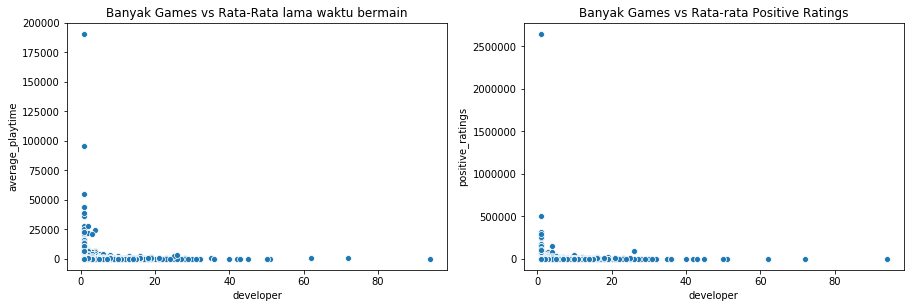

In [22]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
sns.scatterplot(a.developer, a.average_playtime)
plt.title('Banyak Games vs Rata-Rata lama waktu bermain')

plt.subplot(2,2,2)
sns.scatterplot(a.developer, a.positive_ratings)
plt.title('Banyak Games vs Rata-rata Positive Ratings')
plt.show()

Tanpa Melihat nilai korelasinya sudah cukup jelas bahwa banyak game yang dikembangkan oleh suatu developer tidak berpengaruh terhadap kesuksesan mereka

## II.E Feature Publisher

In [23]:
publisher = df['publisher'].value_counts()
print('Terdapat {} publisher yang berbeda'.format(len(publisher)))

Terdapat 14354 publisher yang berbeda


In [24]:
# Top 15 Publisher
fig = go.Figure(data=go.Bar(x=publisher.sort_values()[-15:].values, y=publisher.sort_values()[-15:].index, 
                        orientation='h', marker_color='#66CCFF', marker_line_color='rgb(8,48,107)',
                           marker_line_width=1.5, opacity=0.6))

fig.update_layout(height=600, width=900, showlegend=False, title_x=0.45,
                  title_text='Top 15 Publisher berdasarkan game terbanyak')
fig.show()

In [25]:
# Menampilkan rata_rata lama bermain, dan rating posivie dari top 15 publisher
df[df['publisher'].isin(publisher.index[:15])].groupby('publisher').mean()[['average_playtime', 'positive_ratings', 'price']]

,average_playtime,positive_ratings,price
publisher,,,
1C Entertainment,135.261364,359.613636,6.192500
Big Fish Games,0.000000,4.438679,6.828679
Choice of Games,0.000000,51.106383,3.851702
Dagestan Technology,105.886364,97.056818,2.697955
Degica,54.064935,362.545455,12.474416
KISS ltd,375.676056,204.225352,5.777465
"KOEI TECMO GAMES CO., LTD.",388.929577,558.957746,27.929859
Plug In Digital,46.500000,77.111111,6.380833
SEGA,766.012821,3047.423077,13.311410


> Berbeda dengan developer, top 15 Publisher memiliki waktu bermain dan positive ratings yang cukup tinggi. Dan nama-nama publisher yang tertera cukup terkenal

In [26]:
# Membuat pivot table dan menggabungkannya dengan banyak developer
a = pd.pivot_table(data=df, index='publisher', aggfunc='mean')
a = a[['average_playtime', 'positive_ratings']].join(publisher)
a

,average_playtime,positive_ratings,publisher
publisher,,,
,155.333333,726.166667,6
Milestone S.r.l.,0.000000,64.000000,1
AFBIK Studio,0.000000,37.000000,3
AYE Technology,0.000000,6.000000,1
Anea_Duo_Dev,0.000000,5.000000,1
...,...,...,...
飞鹰互娱,0.000000,10.000000,1
香港商河洛互動娛樂股份有限公司;方块游戏,0.000000,851.000000,1
魂动天下,0.000000,3.000000,1


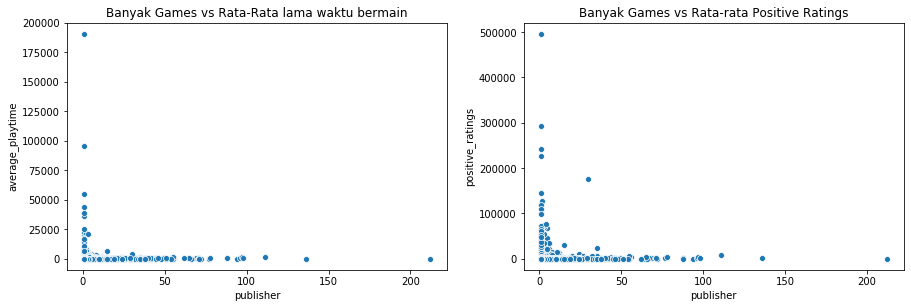

In [27]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
sns.scatterplot(a.publisher, a.average_playtime)
plt.title('Banyak Games vs Rata-Rata lama waktu bermain')

plt.subplot(2,2,2)
sns.scatterplot(a.publisher, a.positive_ratings)
plt.title('Banyak Games vs Rata-rata Positive Ratings')
plt.show()

Namun ternyata dapat dilihat bahwa banyaknya game yang dipublish oleh suatu perusahaan tidak menentukan keseksesan mereka

## II.F Feature Platforms

In [28]:
df.platforms.value_counts()

windows              18398
windows;mac;linux     4623
windows;mac           3439
windows;linux          610
mac                      3
mac;linux                1
linux                    1
Name: platforms, dtype: int64

In [29]:
# Menggabungkan sehingga hanya menjadi 3 platform saja
Platforms=list(platform.split(';') for platform in df.platforms)
Platforms=list(itertools.chain.from_iterable(Platforms))
Platforms=pd.value_counts(Platforms)

In [30]:
fig = go.Figure(data=go.Bar(x=Platforms.values/len(df), y=Platforms.index, 
                        orientation='h', marker_color='#66CCFF', marker_line_color='rgb(8,48,107)',
                           marker_line_width=1.5, opacity=0.6))

fig.update_layout(height=500, width=900, showlegend=False, title_x=0.45,
                  title_text='Persentasi platform')
fig.show()

Hampir semua game di Steam mendukung platform windows. Hal ini bukanlah hal yang aneh mengingat hampir semua orang menggunakan system operasi windows.

Hal menarik lainnya adalah game apa saja yang tidak mendukung system operasi windows.

In [31]:
# List game yang tidak mendukung system operasi windows
df[df['platforms'] == 'linux'].append(df[df['platforms'] == 'mac']).append(df[df['platforms'] == 'mac;linux'])

,appid,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,owners,price,year,month
20530,805260,PICNIC,2018-03-04,1,A.D. Klumpp,A.D. Klumpp,linux,0,Single-player,Indie,Indie,0,2,0,0,0,0-20000,0.00,2018,3
1413,214630,Call of Duty: Black Ops - Mac Edition,2012-09-27,1,Aspyr,Aspyr,mac,18,Single-player;Multi-player;Co-op;Steam Achieve...,Action,Action;Zombies;Multiplayer,68,168,105,0,0,50000-100000,15.49,2012,9
12479,569050,Paul Pixel - The Awakening,2017-01-09,1,Xoron GmbH,Xoron GmbH,mac,0,Single-player,Adventure;Indie,Adventure;Indie;Point & Click,0,5,0,0,0,0-20000,2.89,2017,1
16662,694180,MobileZombie,2017-10-13,1,YIMING ZHANG,YIMING ZHANG,mac,0,Single-player;Partial Controller Support,Adventure;Casual;Free to Play;Indie,Free to Play;Adventure;Indie,0,14,11,0,0,0-20000,0.00,2017,10
13387,594550,Arma: Cold War Assault Mac/Linux,2017-03-14,1,Bohemia Interactive,Bohemia Interactive,mac;linux,16,Single-player,Violent;Action;Simulation;Strategy,Simulation;Strategy;Action,0,40,10,0,0,0-20000,3.49,2017,3


Rata-rata waktu bermain dan positive review untuk game yang tidak mendukung system operasi windows sangatlah kecil. Mesikupan ada nama game yang cukup ternama seperti Call of Duty

## II.G Feature required_age

In [32]:
# Persentase banyaknya game berdasarkan usia minimum
df['required_age'].value_counts(normalize=True)

0     0.977987
18    0.011376
16    0.007091
12    0.002696
7     0.000443
3     0.000406
Name: required_age, dtype: float64

> 97% Game dapat dimainkan oleh semua umur, game kategori dewasa sekitar 0.01%

In [33]:
# Persentase banyaknya game yang memerlukan usia minimum
umur = df[df['required_age']>0]['required_age'].value_counts()
umur

18    308
16    192
12     73
7      12
3      11
Name: required_age, dtype: int64

In [34]:
fig = go.Figure(data=go.Pie(labels=umur.index, values=umur.values, 
                             pull=(0.1,0,0.1,0.05,0.2), marker_colors=['#003399','#0099CC','#66CCFF','#CCFFCC','#6699FF'],rotation=90))
fig.layout = dict(height=600, width=800, title_text="Persentase Syarat Umur",title_x=0.45)
fig.show()

> 50% dari game yang memiliki batasan usia berkategori dewasa (18+) dan 32% berkategori 16+

Genre apa saja yang termuat dalam game kategori ini ?

In [35]:
# Game kategori 16+
df[df['required_age']==16]['steamspy_tags'].value_counts()

Adventure;Otome;Visual Novel            5
Strategy;Warhammer 40K;RTS              4
Early Access;Action;Indie               3
RPG;Post-apocalyptic;Classic            2
Adventure;Visual Novel;Otome            2
                                       ..
Souls-like;RPG;Action                   1
Nudity;Story Rich;Pixel Graphics        1
Simulation;Strategy;Action              1
Adventure;Point & Click;Singleplayer    1
Simulation;VR;Fantasy                   1
Name: steamspy_tags, Length: 170, dtype: int64

In [36]:
# Game kategori 18+
df[df['required_age']==18]['steamspy_tags'].value_counts()

Adventure;Indie;Horror                4
Sexual Content;Nudity;Visual Novel    4
Early Access;Action;Indie             4
Zombies;Action;Open World             4
Action;Gore;Violent                   3
                                     ..
World War II;FPS;Multiplayer          1
Sexual Content;Nudity;Indie           1
Action;Classic;Dark Humor             1
Nudity;Sexual Content;Visual Novel    1
Free to Play;Action;Open World        1
Name: steamspy_tags, Length: 263, dtype: int64

> Game kategori 16+ didominasi oleh game dari genre Action. Sedangkan katekori 18+ merupakan game yang memuat unsur sexual atau horror

## II.H Feature Categories
Satu judul game bisa memiliki lebih dari 1 category, sehingga kita perlu mengekstraknya terlebih dahulu

In [37]:
print('Contoh Categories pada suatu permainan')
print('-'*60)
print(df.categories[0])
print(df.categories[1])
print(df.categories[2])

Contoh Categories pada suatu permainan
------------------------------------------------------------
Multi-player;Online Multi-Player;Local Multi-Player;Valve Anti-Cheat enabled
Multi-player;Online Multi-Player;Local Multi-Player;Valve Anti-Cheat enabled
Multi-player;Valve Anti-Cheat enabled


In [38]:
# Menghitung banyaknya game dalam satu jenis kategori
Categories=list(category.split(';') for category in df.categories)
Categories=list(itertools.chain.from_iterable(Categories))
Categories=pd.value_counts(Categories)

In [39]:
trace = go.Table(
    header=dict(values=['Categories', 'Total']), cells=dict(values=[Categories.index,Categories.values]),
    domain=dict(x=[0, 0.25],
                y=[0, 1]))

trace1 = go.Bar(x=Categories.index,y=Categories.values,
               marker_color='#66CCFF', marker_line_color='rgb(8,48,107)',
               marker_line_width=1.5, opacity=0.6)

layout = dict(xaxis1=dict( dict(domain=[0.3, 1])), yaxis1=dict( dict(domain=[0, 1])), 
            height=600, width=1000, title_text="Total Game by Categories",title_x=0.5)

fig = go.Figure(data = [trace,trace1], layout = layout)
fig.show()

> Game berkategori Single-Player merupakan game yang paling banyak.

## II.I Feature Genres

In [40]:
print('Contoh Genres pada suatu permainan')
print('-'*60)
print(df.genres[0])
print(df.genres[1000])
print(df.genres[2000])

Contoh Genres pada suatu permainan
------------------------------------------------------------
Action
Action;Casual;Indie
Indie;Simulation;Early Access


In [41]:
Genres=list(genre.split(';') for genre in df.genres)
Genres=list(itertools.chain.from_iterable(Genres))
Genres=pd.value_counts(Genres)

In [42]:
trace = go.Table(
    header=dict(values=['Genres', 'Total']), cells=dict(values=[Genres.index,Genres.values]),
    domain=dict(x=[0, 0.25], y=[0, 1]))

trace1 = go.Bar(x=Genres.index,y=Genres.values,
               marker_color='#66CCFF', marker_line_color='rgb(8,48,107)',
               marker_line_width=1.5, opacity=0.6)

layout = dict(xaxis1=dict( dict(domain=[0.3, 1])), yaxis1=dict( dict(domain=[0, 1])), 
            height=600, width=1000, title_text="Total Steam Games by Genre",title_x=0.5)

fig = go.Figure(data = [trace,trace1], layout = layout)
fig.show()

> Indi game merupakan game yang dibuat oleh perorangan atau perusahaan kecil, maka tidak aneh genre indi merupakan genre yang paling banyak.

## II.J Feature Steamspy tags
Feature ini merupakan genre berdasarkan dari voting para pemain

In [43]:
print('Contoh Steamspy tags pada suatu permainan')
print('-'*60)
print(df.categories[0])
print(df.categories[1000])
print(df.categories[2000])

Contoh Steamspy tags pada suatu permainan
------------------------------------------------------------
Multi-player;Online Multi-Player;Local Multi-Player;Valve Anti-Cheat enabled
Single-player;Steam Achievements;Partial Controller Support;Steam Leaderboards
Single-player;Steam Achievements;Partial Controller Support;Steam Cloud;Stats;Steam Leaderboards


In [44]:
Steam_tags=list(tags.split(';') for tags in df.steamspy_tags)
Steam_tags=list(itertools.chain.from_iterable(Steam_tags))
Steam_tags=pd.value_counts(Steam_tags)

trace = go.Table(
    header=dict(values=['Steam Tags', 'Total']), cells=dict(values=[Steam_tags.index,Steam_tags.values]),
    domain=dict(x=[0, 0.25], y=[0, 1]))

trace1 = go.Bar(x=Steam_tags.index,y=Steam_tags.values,
               marker_color='#66CCFF', marker_line_color='rgb(8,48,107)',
               marker_line_width=1.5, opacity=0.6)

layout = dict(xaxis1=dict( dict(domain=[0.3, 1])), yaxis1=dict( dict(domain=[0, 1])), 
            height=600, width=1000, title_text="Total Steam Games by Steamspy Tags",title_x=0.5)

fig = go.Figure(data = [trace,trace1], layout = layout)
fig.show()

> Feature ini hampir sama dengan genre namun terlihat lebih mendetail dalam pengelompokannya sehingga menghasilkan genre genre baru yang lebih detail dan bervariasi, meskipun masih didominasi oleh game ber genre Indie

## II.K Feature Achievements

In [45]:
# Plot distribusi dan boxplot dari feature achievements
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Box(y=df["achievements"]),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=df["achievements"]),
    row=1, col=2
)
fig.update_layout(height=400, width=1000, title_text="Boxplot dan distribution plot dari achievements", showlegend=False)
fig.show()

Dari boxplot dapat dilihat bahwa seolah-olah sangat banyak sekali outlier hal ini diakibatkan oleh banyaknya achiemevent yang bernilai sangat kecil

In [46]:
# Plot distribusi dan boxplot dari feature yang memiliki achievements
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Box(y=np.log(df[df["achievements"]>0]['achievements'])),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=np.log(df[df["achievements"]>0]['achievements'])),
    row=1, col=2
)
fig.update_layout(height=400, width=1000, title_text="Boxplot dan distribution plot dari achievements", showlegend=False)
fig.show()

Beberapa game memiliki feature achievements dan beberapa tidak. Dengan range banyaknya achiement dari 0-9000. sehingga akan lebih baik jika dibuat variable baru untuk membedakannya tanpa memperhatikan berapa achievement yang dimiliki oleh suatu game

In [47]:
# Membuat Feature baru bertype bolean, memiliki achievements atau tidak
df = df.assign(**{'has_achievements':df.achievements > 0})
achievement = df['has_achievements'].value_counts()
achievement

True     15211
False    11864
Name: has_achievements, dtype: int64

In [48]:
fig = go.Figure(data=go.Pie(labels=['Have achievement', 'no achievement'], values=[15211,11864], 
                             pull=[0,0.1], marker_colors=['#66CCFF','gold'],rotation=-45))
fig.layout = dict(height=600, width=800, title_text="Persentase game dengan achievement",title_x=0.45)
fig.show()

Apakah game yang memiliki Feature Achievement lebih banyak dimainkan?? Apakah memiliki positive rating yang lebih banyak?

In [49]:
achiev =  df.groupby('has_achievements').mean()
achiev

,appid,english,required_age,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,price,month
has_achievements,,,,,,,,,,
False,609308.112778,0.972690,0.262812,0.000000,471.538941,127.569875,129.010199,128.879804,5.296567,6.565408
True,585982.417132,0.987706,0.426731,80.541253,1413.173624,276.120636,166.024062,159.452830,6.687832,6.547696


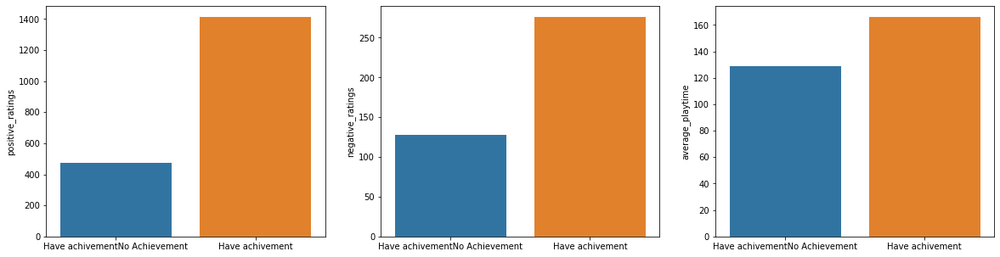

In [50]:
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.barplot(x=['Have achivement''No Achievement','Have achivement'], y =achiev['positive_ratings'])
plt.subplot(1,3,2)
sns.barplot(x=['Have achivement''No Achievement','Have achivement'], y =achiev['negative_ratings'])
plt.subplot(1,3,3)
sns.barplot(x=['Have achivement''No Achievement','Have achivement'], y =achiev['average_playtime'])

Game yang memiliki feature achivement lebih banyak dimainkan dan mendapat review yang lebih banyak

## II. L Feature Postive & Negative Rating
Banyaknya rating yang diberikan untuk suatu game berbeda-beda. Sehingga untuk membuatnya adil dan dapat dianalisis. Suatu feature baru akan dibuat yaitu "positive rate" yang merupakan nilai : **Positive_ratings/(Positive_ratings + Negative_ratings)**

In [51]:
# Membuat Feature baru overall_reviews da positive_rate
df = df.assign(**{'overall_reviews':df.positive_ratings + df.negative_ratings})
df = df.assign(**{'positive_rate':df.positive_ratings / df.overall_reviews})

In [52]:
fig = make_subplots(rows=4, cols=1, subplot_titles=('Distribusi Data positive_rate untuk semua game', 
                                                    'Distribusi Data positive_rate untuk semua game dengan jumlah reviews > 50',
                                                    'Distribusi Data positive_rate untuk semua game dengan jumlah reviews > 100',
                                                   'Distribusi Data positive_rate untuk semua game dengan jumlah reviews > 1000'))

fig.append_trace(go.Histogram(x=df.positive_rate, marker_color='#66CCFF', ), row=1, col=1)

fig.append_trace(go.Histogram(x=df[df.overall_reviews > 50].positive_rate, marker_color='#66CCFF'), row=2, col=1)

fig.append_trace(go.Histogram(x=df[df.overall_reviews > 100].positive_rate, marker_color='#66CCFF'), row=3, col=1)

fig.append_trace(go.Histogram(x=df[df.overall_reviews > 1000].positive_rate, marker_color='#66CCFF'), row=4, col=1)

fig.update_layout(height=900, width=900, showlegend=False)
fig.show()

> Positive rate memiliki distribusi yang skewed ke kanan, artinya kebanyakan game cenderung memiliki reviews positive dari para penggunanya (distribusi nampak sama ketika kita membatasi game dengan minimum 50 reviews)

Berikut ini merupakan list game yang di urutkan berdasarkan positive ratenya, saya menjadikan positive rate ini sebagai acuan apakah suatu game itu baik atau tidak

### 'Game Terbaik' dengan rewiews > 500

In [53]:
colum = ['name', 'release_date', 'developer', 'categories', 'genres', 'average_playtime', 'owners', 'price', 'overall_reviews', 'positive_rate']
df[df.overall_reviews > 500].sort_values('positive_rate', ascending=False)[colum].head(5)

,name,release_date,developer,categories,genres,average_playtime,owners,price,overall_reviews,positive_rate
23296,Sabbat of the Witch,2018-10-26,Yuzusoft,Single-player;Steam Achievements;Steam Trading...,Adventure;Casual;Simulation,0,0-20000,23.79,523,0.996176
14298,planetarian HD,2017-05-08,VisualArts/Key,Single-player;Steam Achievements;Steam Trading...,Adventure;Casual;Simulation,0,0-20000,6.99,937,0.989328
18404,東方天空璋 ～ Hidden Star in Four Seasons.,2017-11-17,上海アリス幻樂団,Single-player;Partial Controller Support;Steam...,Action;Indie,413,50000-100000,11.39,4167,0.987281
13727,Monolith,2017-06-07,Team D-13,Single-player;Steam Achievements;Full controll...,Action;Indie,80,20000-50000,5.59,529,0.986767
23,Portal 2,2011-04-18,Valve,Single-player;Co-op;Steam Achievements;Full co...,Action;Adventure,1102,10000000-20000000,7.19,140111,0.986504


### 'Game Terbaik' dengan rewiews > 50k

In [54]:
colum = ['name', 'release_date', 'developer', 'categories', 'genres', 'average_playtime', 'owners', 'price', 'overall_reviews', 'positive_rate']
df[df.overall_reviews > 50000].sort_values('positive_rate', ascending=False)[colum].head(5)

,name,release_date,developer,categories,genres,average_playtime,owners,price,overall_reviews,positive_rate
23,Portal 2,2011-04-18,Valve,Single-player;Co-op;Steam Achievements;Full co...,Action;Adventure,1102,10000000-20000000,7.19,140111,0.986504
17,Portal,2007-10-10,Valve,Single-player;Steam Achievements;Captions avai...,Action,288,10000000-20000000,7.19,52881,0.979577
2964,The Witcher® 3: Wild Hunt,2015-05-18,CD PROJEKT RED,Single-player;Steam Achievements;Full controll...,RPG,3068,5000000-10000000,24.99,207728,0.976902
1962,The Binding of Isaac: Rebirth,2014-11-04,"Nicalis, Inc.",Single-player;Shared/Split Screen;Steam Achiev...,Action,4583,2000000-5000000,10.99,74670,0.975358
0,Counter-Strike,2000-11-01,Valve,Multi-player;Online Multi-Player;Local Multi-P...,Action,17612,10000000-20000000,7.19,127873,0.973888


### 'Game Terburuk' dengan rewiews > 500

In [55]:
colum = ['name', 'release_date', 'developer', 'categories', 'genres', 'average_playtime', 'owners', 'price', 'overall_reviews', 'positive_rate']
df[df.overall_reviews > 500].sort_values('positive_rate', ascending=True)[colum].head(5)

,name,release_date,developer,categories,genres,average_playtime,owners,price,overall_reviews,positive_rate
1197,Flatout 3: Chaos & Destruction,2011-12-13,Team 6 Studios,Single-player;Multi-player;Co-op;Partial Contr...,Racing,19,200000-500000,6.99,2164,0.134011
2513,Game Tycoon 1.5,2014-02-11,Sunlight Games,Single-player;Steam Cloud,Simulation;Strategy,240,100000-200000,0.79,636,0.139937
2367,Airport Simulator 2014,2013-12-19,United Independent Entertainment GmbH,Single-player;Steam Cloud,Simulation,0,50000-100000,6.99,946,0.151163
2988,Uriel's Chasm,2014-09-12,Rail Slave Games,Single-player;Steam Trading Cards,Adventure;Casual;Indie,188,200000-500000,3.99,2765,0.169982
7449,Godus Wars,2016-02-03,22cans,Single-player;Partial Controller Support;Steam...,Casual;Indie;Simulation;Strategy;Early Access,0,100000-200000,10.99,531,0.171375


### 'Game Terburuk' dengan rewiews > 50k

In [56]:
colum = ['name', 'release_date', 'developer', 'categories', 'genres', 'average_playtime', 'owners', 'price', 'overall_reviews', 'positive_rate']
df[df.overall_reviews > 50000].sort_values('positive_rate', ascending=True)[colum].head(5)

,name,release_date,developer,categories,genres,average_playtime,owners,price,overall_reviews,positive_rate
12836,PLAYERUNKNOWN'S BATTLEGROUNDS,2017-12-21,PUBG Corporation,Multi-player;Online Multi-Player;Stats,Action;Adventure;Massively Multiplayer,22938,50000000-100000000,26.99,983260,0.504632
2563,No Man's Sky,2016-08-12,Hello Games,Single-player;Multi-player;Online Multi-Player...,Action;Adventure,2004,1000000-2000000,39.99,119932,0.529000
7809,Z1 Battle Royale,2018-02-28,NantG,Multi-player;Online Multi-Player;In-App Purchases,Action;Adventure;Free to Play;Massively Multip...,3142,10000000-20000000,0.00,203098,0.548671
3347,FOR HONOR™,2017-02-13,Ubisoft Montreal;Ubisoft Quebec;Ubisoft Toront...,Single-player;Online Multi-Player;Online Co-op...,Action,951,2000000-5000000,12.49,60710,0.573052
1506,DayZ,2018-12-13,Bohemia Interactive,Multi-player;Online Multi-Player;Steam Worksho...,Action;Adventure;Massively Multiplayer,7235,2000000-5000000,33.99,195604,0.605484


### II.M Feature Average Playtime
Sangat banyak game yang memiliki waktu bermain 0. cukup menarik untuk melihat perbandingannya

In [57]:
# Plot Distribusi rata-rata waktu bermain
fig = go.Figure(data=go.Histogram(x=df['average_playtime']+10**-10, marker_color='#66CCFF', nbinsx=100))

fig.update_layout(height=500, width=900, showlegend=False, title_x=0.45,
                  title_text='Distribusi Average Playtime', yaxis_type="log")
fig.show()

In [58]:
# Banyaknya game dengan waktu bermain nol dan tidak nol
(df.average_playtime == 0).value_counts()

True     20905
False     6170
Name: average_playtime, dtype: int64

In [59]:
fig = go.Figure(data=go.Pie(labels=['Waktu bermain nol', 'Waktu bermain tidak nol'], values=[20905,6170], 
                             pull=[0,0.1], marker_colors=['#66CCFF','gold'],rotation=-45))
fig.layout = dict(height=600, width=800, title_text="Persentase Waktu bermain nol vs tidak",title_x=0.45)
fig.show()

> 77.2% Game yang dipublish belum pernah dimainkan sama sekali.

## II.N Feature Owners
Karena banyak sekali 0 maka perlu dilakukan 'rename' pada feature onwers agar lebih mudah dimengerti

In [60]:
#Melakukan 'rename' pada feature onwers agar lebih mudah dimengerti
mask = df.owners.isin(['10000000-20000000', '20000000-50000000', '50000000-100000000', '100000000-200000000'])
df.loc[mask, 'owners'] = '10mil and more'
df.loc[df.owners == '5000000-10000000', 'owners'] = '5mil-10mil'
df.loc[df.owners == '2000000-5000000', 'owners'] = '2mil-5mil'
df.loc[df.owners == '1000000-2000000', 'owners'] = '1mil-2mil'
df.loc[df.owners == '500000-1000000', 'owners'] = '500k-1mil'
df.loc[df.owners == '200000-500000', 'owners'] = '200k-500k'
df.loc[df.owners == '100000-200000', 'owners'] = '100k-200k'
df.loc[df.owners == '50000-100000', 'owners'] = '50k-100k'
df.loc[df.owners == '20000-50000', 'owners'] = '20k-50k'
df.loc[df.owners == '0-20000', 'owners'] = '20k or less'

In [61]:
owners = df.owners.value_counts().sort_values()
fig = go.Figure(data=go.Bar(x=owners.values, y=owners.index, 
                        orientation='h', marker_color='#66CCFF', marker_line_color='rgb(8,48,107)',
                           marker_line_width=1.5, opacity=0.6))

fig.update_layout(height=500, width=900, showlegend=False, title_x=0.45,
                  title_text='Distribusi Owners')
fig.show()

> 18 ribu games (66%) hanya dimilki oleh kurang dari 20 ribu pengguna, dan hanya ada 27 game yang dimiliki oleh lebih dari 10 juta pengguna. Hal ini menunjukan persaingan yang sangat ketat dalam industri game

### Game terlaris di Steam

In [62]:
df[df.owners == '10mil and more'].sort_values('positive_rate', ascending=False)[colum].head(27)

,name,release_date,developer,categories,genres,average_playtime,owners,price,overall_reviews,positive_rate
23,Portal 2,2011-04-18,Valve,Single-player;Co-op;Steam Achievements;Full co...,Action;Adventure,1102,10mil and more,7.19,140111,0.986504
17,Portal,2007-10-10,Valve,Single-player;Steam Achievements;Captions avai...,Action,288,10mil and more,7.19,52881,0.979577
0,Counter-Strike,2000-11-01,Valve,Multi-player;Online Multi-Player;Local Multi-P...,Action,17612,10mil and more,7.19,127873,0.973888
21,Left 4 Dead 2,2009-11-19,Valve,Single-player;Multi-player;Co-op;Steam Achieve...,Action,1615,10mil and more,7.19,260207,0.967649
9,Half-Life 2,2004-11-16,Valve,Single-player;Steam Achievements;Steam Trading...,Action,691,10mil and more,7.19,70321,0.965601
121,Garry's Mod,2006-11-29,Facepunch Studios,Single-player;Multi-player;Co-op;Cross-Platfor...,Indie;Simulation,12422,10mil and more,6.99,380154,0.956773
10,Counter-Strike: Source,2004-11-01,Valve,Multi-player;Cross-Platform Multiplayer;Steam ...,Action,6842,10mil and more,7.19,80137,0.956362
1025,The Elder Scrolls V: Skyrim,2011-11-10,Bethesda Game Studios,Single-player;Steam Achievements;Steam Trading...,RPG,7089,10mil and more,9.99,252254,0.940730
19,Team Fortress 2,2007-10-10,Valve,Multi-player;Cross-Platform Multiplayer;Steam ...,Action;Free to Play,8495,10mil and more,0.00,549915,0.938107
1772,Path of Exile,2013-10-23,Grinding Gear Games,Single-player;Multi-player;Online Multi-Player...,Action;Adventure;Free to Play;Indie;Massively ...,5263,10mil and more,0.00,77710,0.921284


> Game yang paling banyak dimiliki memiliki average_playtime dan positive rate yang cukup tinggi dan kekambangkan oleh Valve. dan Valve tidak termasuk top 15 Perusahaan yang paling banyak mempublish atau mengembangkan suatu game.

## II.O Feature Price
Bagaimana perbandingan antara game gratis vs game berbayar

In [63]:
# Membuat feature baru 'True' untuk game gratis
df = df.assign(**{'free':df.price == 0})
free = df.free.value_counts()
free

False    24515
True      2560
Name: free, dtype: int64

In [64]:
# Pie Chart
fig = go.Figure(data=go.Pie(labels=['Berbayar', 'Gratis'], values=[24515,2560], 
                             pull=[0,0.1], marker_colors=['#66CCFF','gold'],rotation=-45))
fig.layout = dict(height=600, width=800, title_text="Persentase Waktu bermain nol vs tidak",title_x=0.45)
fig.show()

> 90% game yang ada di steam merupakan game berbayar

Semua orang tentu suka game yang gratis, terlebih lagi untuk anak-anak, namun Apakah game gratis memiliki rata-rata waktu bermain dan positive rate yang lebih besar?

In [65]:
fre = df.groupby('free').mean()
fre

,appid,english,required_age,achievements,positive_ratings,negative_ratings,average_playtime,median_playtime,price,month,has_achievements,overall_reviews,positive_rate
free,,,,,,,,,,,,,
False,591473.156884,0.982949,0.364063,47.752396,784.935346,167.258454,117.085866,116.447767,6.712914,6.550765,0.580583,952.193800,0.713999
True,641502.170312,0.963672,0.267188,21.274609,3065.403125,630.163672,463.128516,429.589844,0.000000,6.600391,0.382031,3695.566797,0.719060


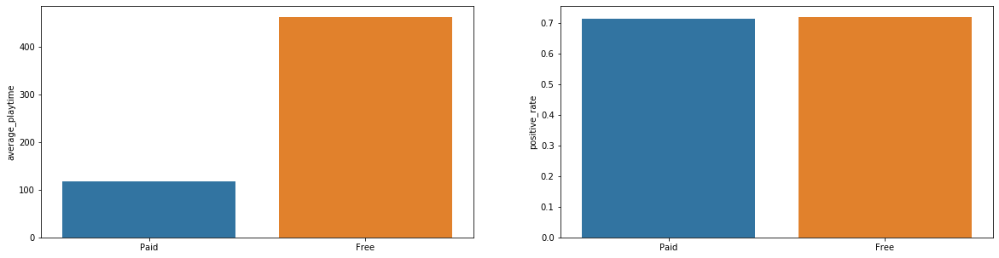

In [66]:
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
sns.barplot(x=['Paid','Free'], y =fre['average_playtime'])
plt.subplot(1,2,2)
sns.barplot(x=['Paid','Free'], y =fre['positive_rate'])

Game gratis lebih banyak dimainkan, namun tidak memiliki positive rate yang lebih baik daripada game berbayar

## II.P Feature Dynamics Visualization
Sebelum berlanjut ke data cleaning. Saya akan mengamati bagaimana hubungan antara suatu feature dengan feature lainnya yang tidak sempat dijelaskan pada pemaparan untuk setiap feature.

### Total Waktu bermain

In [67]:
fig = go.Figure(data=go.Scatter(x=df.groupby('year').sum()['average_playtime'].index, 
                                y=df.groupby('year').sum()['average_playtime'].values))
fig.layout = dict(height=400, width=800, title_text="Total Pengguna disetiap tahun",title_x=0.45)
fig.show()

> Terjadi peningkatan dari tahun ke tahun

### Positive Rate dari tahun ke tahun

In [68]:
# Hubungan antara Tahun rilis dengan Positive Rate
fig = go.Figure(data=go.Scatter(x=df.groupby('year').mean()['positive_rate'].index, 
                                y=df.groupby('year').mean()['positive_rate'].values))
fig.layout = dict(height=400, width=800, title_text="Rata-rata positive Rate",title_x=0.45)
fig.show()

Ada beberapa hal yang mendasari mengapa hal ini dapat terjadi :
    - Dari tahun ke tahun ekspektasi seseorang terhadap suatu game semakin tinggi.
    - Karena perkembangan game yang begitu cepat, makin banyak game yang dipublish setiap tahun, makin banyak   genre yang ditawarkan maka orang-orang menjadi sulit untuk menentukan game mana yang harus mereka mainkan

### Korelasi Setiap Feature

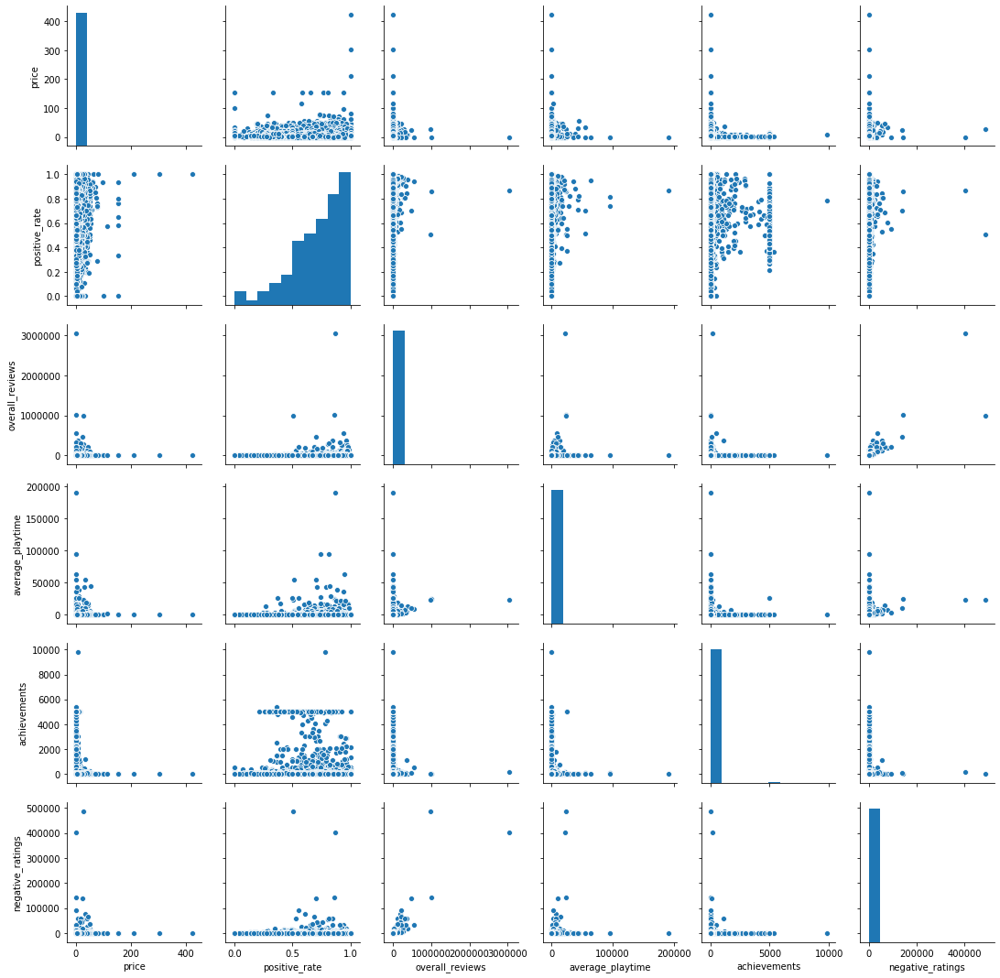

In [69]:
numerical_feature = df[['price', 'positive_rate', 'release_date', 'overall_reviews', 'average_playtime','achievements', 'negative_ratings']]
sns.pairplot(numerical_feature)

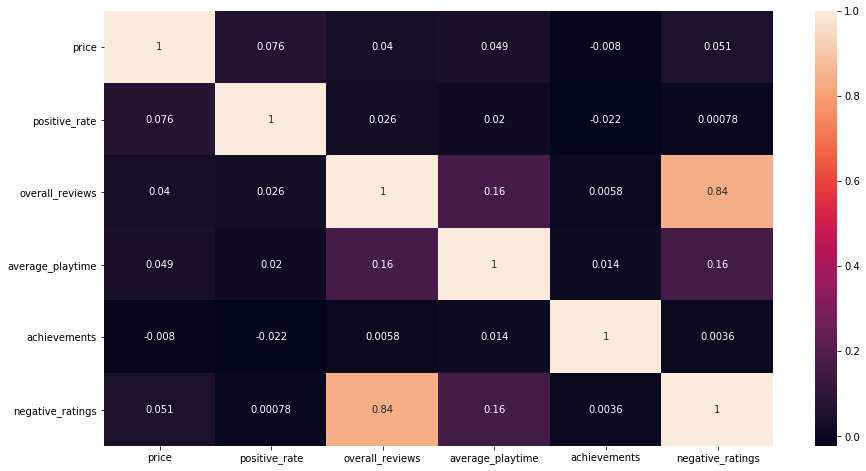

In [70]:
plt.figure(figsize = (15,8))
sns.heatmap(numerical_feature.corr(), annot=True )

> Hubungan antara setiap feature numericalnya cenderung kecil kecuali pada overall_reviews dan negative_ratings

In [71]:
df.to_csv('steam_visual.csv')

**Beberapa Kesimpulan yang penting**
- Banyaknya game yang dikembangkan, maupun diproduksi tidak menjamin kesuksesan dari suatu perusahaan game
- Game gratis lebih banyak dimainkan daripada game yang berbayar
- Dari tahun ketahun penikmat video game meningkat cukup pesat
- Peningkatan penikmat game justru mengurangi review positive yang gamers berikan


Dari EDA diatas saya memutuskan untuk melakukan modeling sistem rekomendasi berdasarkan genre dan juga tags. Saya ingin membuat suatu system yang dapat menyelasikan salah satu masalah diatas. Dengan adanya system rekomendasi yang baik, diharapkan dapat membuat gamers menjadi lebih mudah untuk memilih game mana yang seharusnya mereka coba untuk mainkan

## III. Data Cleaning

Dari EDA yang telah dilakukan didapatkan banyak informasi penting untuk dilakukan cleaning data diantaranya :
- Penghapusan beberapa feature yang dinilai kurang penting
- Beberapa game tidak support dengan bahasa inggris
- Judul game tidaklah unique
- Banyak game yang memiliki overall_reviews nol
- Banyak game yang memiliki rata-rata waktu bermain nol
Oleh karena hal tersebut, maka saya akan melakukan beberapa hal berikut ini

### III.A Menghapus beberapa feature yang dinilai kurang penting

appid bersifat unique, sedangkan median_playtime menurut saya sudah diwakilkan oleh average_playtime

In [72]:
# Menghapus feature appid, median_playtime
df.drop(['appid', 'median_playtime'], axis=1, inplace=True)
df.reset_index(drop=True, inplace=True)

### III. B Menghapus game yang tidak support dengan bahasa Inggris
Saya hanya akan berfokus pada game yang mendukung bahasa Inggris

In [73]:
df.drop(df[df.english == 0].index, inplace=True)
df.reset_index(drop=True, inplace=True)

### III.C Menghapus game yang memiliki average play time 0
Menghapus game yang memiliki rata-rata waktu bermain 0 sangatlah penting menurut saya, karena game-game ini merupakan game yang tidak pernah dimainkan, selain itu juga terdapat sekitar 27000 ribu game yang akan memakan cukup banyak memory ketika melakukan perhitungan pada cosin similarity untuk melakukan system rekomendasi

Perbandingan data antara game dengan rata-rata waktu bermain nol dan tidak nol

In [74]:
(df.average_playtime == 0).value_counts()

True     20439
False     6125
Name: average_playtime, dtype: int64

In [75]:
df[df['average_playtime']!=0].describe()[['positive_ratings', 'negative_ratings','overall_reviews']]

,positive_ratings,negative_ratings,overall_reviews
count,6.125000e+03,6125.000000,6.125000e+03
mean,4.202118e+03,862.706776,5.064824e+03
std,3.975707e+04,8978.151354,4.695261e+04
min,0.000000e+00,0.000000,1.000000e+00
25%,1.050000e+02,38.000000,1.630000e+02
50%,4.080000e+02,113.000000,5.530000e+02
75%,1.706000e+03,368.000000,2.150000e+03
max,2.644404e+06,487076.000000,3.046717e+06


In [76]:
df[df['average_playtime']==0].describe()[['positive_ratings', 'negative_ratings','overall_reviews']]

,positive_ratings,negative_ratings,overall_reviews
count,20439.000000,20439.000000,20439.000000
mean,61.681540,20.143402,81.824943
std,186.119602,64.922851,233.108538
min,0.000000,0.000000,1.000000
25%,4.000000,1.000000,7.000000
50%,14.000000,5.000000,21.000000
75%,45.000000,16.000000,63.000000
max,6770.000000,2520.000000,7172.000000


In [77]:
# Menghapus game dengan rata-rata waktu bermain nol
df.drop(df[df['average_playtime']==0].index, inplace=True)
df.reset_index(drop=True, inplace=True)
df.shape

(6125, 22)

### III.D Melakukan pengecekan untuk game dengan nama yang tidak unique

In [78]:
df.name.value_counts()

Eastwood VR                                  1
Beholder 2                                   1
Hidden Folks                                 1
Tokyo Dark                                   1
The Lost                                     1
                                            ..
Tormentum - Dark Sorrow                      1
Crusaders of the Lost Idols                  1
Attack on Titan / A.O.T. Wings of Freedom    1
Village Story                                1
Khet 2.0                                     1
Name: name, Length: 6125, dtype: int64

Ternyata setelah membuang game dengan waktu bermain nol, hal tersebut juga menghapus game-game dengan nama yang sama

In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6125 entries, 0 to 6124
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   name              6125 non-null   object        
 1   release_date      6125 non-null   datetime64[ns]
 2   english           6125 non-null   int64         
 3   developer         6125 non-null   object        
 4   publisher         6125 non-null   object        
 5   platforms         6125 non-null   object        
 6   required_age      6125 non-null   int64         
 7   categories        6125 non-null   object        
 8   genres            6125 non-null   object        
 9   steamspy_tags     6125 non-null   object        
 10  achievements      6125 non-null   int64         
 11  positive_ratings  6125 non-null   int64         
 12  negative_ratings  6125 non-null   int64         
 13  average_playtime  6125 non-null   int64         
 14  owners            6125 n

In [80]:
# Simpan file yang sudah bersih 
df.to_csv('steam_model.csv')

## IV. Modeling

Secara garis besar saya akan membuat 2 sistem rekomendasi yaitu :
1.  Content Based Filtering yang hanya meminta input satu judul game dari pengguna, pada bagian ini akan ada 3 model, yaitu : <br>
1.1 Rekomendasi berdasarkan genre <br>
1.2 Rekomendasi berdasarkan tags <br>
1.3 Rekomendasi berdasarkan genre dan tags <br>
<br>
2. Content Based Filtering yang berdasarkan pada history game yang dimainkan oleh pengguna (History yang dimaksud adalah Judul game yang pernah dimainkan, dan berapa rating pengguna untuk game tersebut. Sama dengan sebelumnya akan ada 3 model yang dibangun, yaitu: <br>
1.1 Rekomendasi berdasarkan History genre dan bobot (rating pengguna) <br>
1.2 Rekomendasi berdasarkan History tags dan bobot (rating pengguna) <br>
1.3 Rekomendasi berdasarkan History genre, tags, dan bobotnya (rating pengguna) <br>

### IV.A Content Based filtering by Genre

In [81]:
# Mengambil feature judul dan genre saja
dfmod_genre = df[['name', 'genres']]
dfmod_genre.head()

,name,genres
0,Counter-Strike,Action
1,Team Fortress Classic,Action
2,Day of Defeat,Action
3,Deathmatch Classic,Action
4,Half-Life: Opposing Force,Action


In [82]:
# Membuat Dataframe baru yang berisi judul dan colom dummy genre
dfdummy_genre = dfmod_genre['genres'].str.get_dummies(';')
dfmod_genre = pd.concat((dfmod_genre['name'], dfdummy_genre), axis=1)
dfmod_genre.head()

,name,Action,Adventure,Animation & Modeling,Audio Production,Casual,Design & Illustration,Early Access,Education,Free to Play,...,Racing,Sexual Content,Simulation,Software Training,Sports,Strategy,Utilities,Video Production,Violent,Web Publishing
0,Counter-Strike,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Team Fortress Classic,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Day of Defeat,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Deathmatch Classic,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Half-Life: Opposing Force,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [83]:
# Perhitungan cosine similarity
from sklearn.metrics.pairwise import cosine_similarity

cosine_mod_genre = cosine_similarity(dfdummy_genre.values, dfdummy_genre.values)
cosine_mod_genre

array([[1.        , 1.        , 1.        , ..., 0.        , 0.        ,
        0.57735027],
       [1.        , 1.        , 1.        , ..., 0.        , 0.        ,
        0.57735027],
       [1.        , 1.        , 1.        , ..., 0.        , 0.        ,
        0.57735027],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.57735027,
        0.57735027],
       [0.        , 0.        , 0.        , ..., 0.57735027, 1.        ,
        0.33333333],
       [0.57735027, 0.57735027, 0.57735027, ..., 0.57735027, 0.33333333,
        1.        ]])

In [84]:
cosine_mod_genre.shape

(6125, 6125)

**Menggunakan cosine similarity pada suatu game**

In [85]:
# Misal akan dicari game yang mirip dengan DOTA 2
judul_game = 'Dota 2'

# Membuat list index dan judul game
games_index = pd.Series(df.index, index=df.name)

# Mencari Index dari judul
idx = games_index[judul_game]
idx

22

In [86]:
# Mengetahui nilai cosine similarity dari suatu game
genre_similarity = cosine_mod_genre[idx]
genre_similarity

array([0.57735027, 0.57735027, 0.57735027, ..., 0.        , 0.        ,
       0.33333333])

In [87]:
# Menampilkan 25 Game yang paling direkomendasikan berdasarkan Genre similarity dan positive rate
result = df[['name', 'release_date', 'developer', 'genres', 'owners', 'price', 'overall_reviews', 'positive_rate', 'price']]
result = result.assign(**{'Genre_similarity':genre_similarity})
print('25 Game yang di Rekomendasikan')
print('-'*100)
result.sort_values(['Genre_similarity', 'positive_rate'], ascending=False).drop(idx).head(25)

25 Game yang di Rekomendasikan
----------------------------------------------------------------------------------------------------


,name,release_date,developer,genres,owners,price,overall_reviews,positive_rate,price,Genre_similarity
269,Empires Mod,2008-07-28,Empires,Action;Free to Play;Strategy,100k-200k,0.00,778,0.852185,0.00,1.000000
3653,Bloons TD Battles,2016-04-20,Ninja Kiwi,Action;Free to Play;Strategy,1mil-2mil,0.00,7713,0.840918,0.00,1.000000
2474,Games of Glory,2017-04-25,Lightbulb Crew,Action;Free to Play;Strategy,200k-500k,0.00,582,0.563574,0.00,1.000000
3665,Battle Islands: Commanders,2017-02-14,DR Studios,Action;Free to Play;Strategy,200k-500k,0.00,754,0.485411,0.00,1.000000
1268,Toribash,2014-05-16,Nabi Studios,Action;Free to Play;Indie;Strategy,2mil-5mil,0.00,12706,0.876987,0.00,0.866025
757,Awesomenauts - the 2D moba,2012-08-01,Ronimo Games,Action;Free to Play;Indie;Strategy,2mil-5mil,0.00,24448,0.849558,0.00,0.866025
786,AirMech Strike,2018-03-30,Carbon Games,Action;Free to Play;Indie;Strategy,1mil-2mil,0.00,9080,0.841410,0.00,0.866025
1936,Block N Load,2015-04-30,Toadman Interactive;Jagex;Artplant,Action;Free to Play;Massively Multiplayer;Stra...,2mil-5mil,0.00,14052,0.772559,0.00,0.866025
2420,Strife®,2015-05-22,S2 Games,Action;Free to Play;RPG;Strategy,1mil-2mil,0.00,4874,0.754411,0.00,0.866025
4921,Dropzone,2017-02-15,Sparkypants Studios LLC,Action;Free to Play;Strategy;Early Access,200k-500k,0.00,800,0.696250,0.00,0.866025


### IV.B Membuat Fungsi untuk Content Based filtering by Genre, Tags, Genre and Tags

In [88]:
# Dataframe Name & tags
dfmod_tags = df[['name', 'steamspy_tags']]
dfdummy_tags = dfmod_tags['steamspy_tags'].str.get_dummies(';')
dfmod_tags = pd.concat((dfmod_tags['name'], dfdummy_tags), axis=1)
dfmod_tags.head()

,name,1980s,1990's,2D,2D Fighter,3D,3D Platformer,4 Player Local,4X,6DOF,...,Wargame,Warhammer 40K,Web Publishing,Werewolves,Western,Word Game,World War I,World War II,Wrestling,Zombies
0,Counter-Strike,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Team Fortress Classic,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Day of Defeat,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,Deathmatch Classic,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Half-Life: Opposing Force,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [89]:
# Dataframe Name & Genres
# Index Game
games_index = pd.Series(df.index, index=df.name)

# Nilai cosine similarity untuk genre dan tags
cosine_mod_genre = cosine_similarity(dfdummy_genre.values, dfdummy_genre.values)
cosine_mod_tags = cosine_similarity(dfdummy_tags.values, dfdummy_tags.values)
dfmod_genre.head()

,name,Action,Adventure,Animation & Modeling,Audio Production,Casual,Design & Illustration,Early Access,Education,Free to Play,...,Racing,Sexual Content,Simulation,Software Training,Sports,Strategy,Utilities,Video Production,Violent,Web Publishing
0,Counter-Strike,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Team Fortress Classic,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Day of Defeat,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Deathmatch Classic,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Half-Life: Opposing Force,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [90]:
# Fungsi rekomendasi sistem berdasarkan genre , tags atau genre&tags

# Index Game
games_index = pd.Series(df.index, index=df.name)

# Nilai cosine similarity untuk genre dan tags
cosine_mod_genre = cosine_similarity(dfdummy_genre.values, dfdummy_genre.values)
cosine_mod_tags = cosine_similarity(dfdummy_tags.values, dfdummy_tags.values)

def content_based_rec(judul_game, recomendation = 'Genre'):
    
    # DataFrame Hasil yang akan ditampilkan
    hasil = df[['name', 'release_date', 'developer', 'genres','steamspy_tags', 'owners', 'price', 'overall_reviews', 'positive_rate', 'price']]
    
    # Mengetahui index dari game yang diinput
    idx = games_index[judul_game]
    
    # Membuat Feature Score untuk masing-masing rekomendasi
    hasil = hasil.assign(**{'Genre_Score':cosine_mod_genre[idx]})
    hasil = hasil.assign(**{'Tags_Score':cosine_mod_tags[idx]})
    hasil = hasil.assign(**{'TagsGenre_Score':(cosine_mod_genre[idx] + cosine_mod_tags[idx])/2})
    
    # Print Dataframe Berdasarkan rekomendasi yang diinginkan
    print('15 Game yang di Rekomendasikan')
    print('-'*100)
    
    if recomendation == 'Genre':
        hasil = hasil.sort_values(['Genre_Score', 'positive_rate'], ascending=False).drop(idx).head(15)
    elif recomendation == 'Tags':
        hasil = hasil.sort_values(['Tags_Score', 'positive_rate'], ascending=False).drop(idx).head(15)
    elif recomendation == 'TagsGenre':
        hasil = hasil.sort_values(['TagsGenre_Score', 'positive_rate'], ascending=False).drop(idx).head(15)
    
    return hasil

In [91]:
content_based_rec('Counter-Strike: Global Offensive', 'TagsGenre')

15 Game yang di Rekomendasikan
----------------------------------------------------------------------------------------------------


,name,release_date,developer,genres,steamspy_tags,owners,price,overall_reviews,positive_rate,price,Genre_Score,Tags_Score,TagsGenre_Score
19,Team Fortress 2,2007-10-10,Valve,Action;Free to Play,Free to Play;Multiplayer;FPS,10mil and more,0.00,549915,0.938107,0.00,1.000000,0.666667,0.833333
3643,Paladins®,2018-05-08,Evil Mojo Games,Action;Free to Play,Free to Play;Multiplayer;FPS,10mil and more,0.00,201987,0.839559,0.00,1.000000,0.666667,0.833333
2352,Dirty Bomb®,2015-06-01,Splash Damage,Action;Free to Play,Free to Play;FPS;Multiplayer,5mil-10mil,0.00,54634,0.800655,0.00,1.000000,0.666667,0.833333
315,BRINK,2011-05-09,Splash Damage,Action;Free to Play,FPS;Action;Multiplayer,1mil-2mil,0.00,5824,0.599760,0.00,1.000000,0.666667,0.833333
2409,Batla,2015-05-14,[geim].pro,Action;Free to Play,Free to Play;FPS;Multiplayer,500k-1mil,0.00,2864,0.587989,0.00,1.000000,0.666667,0.833333
4548,Argo,2017-06-22,Bohemia Interactive,Action;Free to Play,Free to Play;Shooter;Multiplayer,2mil-5mil,0.00,9411,0.471576,0.00,1.000000,0.666667,0.833333
2373,Brick-Force,2014-12-11,Exe Games Inc.,Action;Free to Play,Free to Play;Multiplayer;FPS,500k-1mil,0.00,4366,0.389831,0.00,1.000000,0.666667,0.833333
1534,Fistful of Frags,2014-05-09,Fistful of Frags Team,Action;Free to Play;Indie,Free to Play;Multiplayer;FPS,2mil-5mil,0.00,26202,0.908442,0.00,0.816497,0.666667,0.741582
1842,Warface,2014-07-01,My.com,Action;Free to Play;Massively Multiplayer,Free to Play;FPS;Multiplayer,10mil and more,0.00,47160,0.694466,0.00,0.816497,0.666667,0.741582
5737,Modern Combat Versus,2017-12-19,Gameloft,Action;Adventure;Free to Play,Free to Play;Multiplayer;FPS,500k-1mil,0.00,3622,0.555494,0.00,0.816497,0.666667,0.741582


### IV.C Content Based filtering Melalui Profil Pengguna

Kelebihan dari metode ini adalah rekomendasi tidak hanya berdasarkan dari genre/tags dari suatu game. namun dari seberapa suka user tersebut pada game tersebut

In [92]:
# Contoh Profil pengguna
userInput = [
    {'name':'Dota 2','rating':9},
    {'name':'Counter-Strike', 'rating':7},
    {'name':'Call of Duty® 4: Modern Warfare®', 'rating':8.2},
    {'name':'Counter-Strike: Condition Zero','rating':7},
    {'name':'Artifact', 'rating':5}
]
inputGames = pd.DataFrame(userInput)
inputGames

,name,rating
0,Dota 2,9.0
1,Counter-Strike,7.0
2,Call of Duty® 4: Modern Warfare®,8.2
3,Counter-Strike: Condition Zero,7.0
4,Artifact,5.0


Periksa karakterisitik genre dari 5 game yang dimainkan pengguna :

In [93]:
# filter game dari input
userGames = dfmod_genre[dfmod_genre['name'].isin(inputGames['name'].tolist())]
userGames

,name,Action,Adventure,Animation & Modeling,Audio Production,Casual,Design & Illustration,Early Access,Education,Free to Play,...,Racing,Sexual Content,Simulation,Software Training,Sports,Strategy,Utilities,Video Production,Violent,Web Publishing
0,Counter-Strike,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,Counter-Strike: Condition Zero,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
22,Dota 2,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
140,Call of Duty® 4: Modern Warfare®,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5053,Artifact,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


Ambil matriks karakterisitik genre saja:

In [94]:
# Matriks karakteristik dari user profil
userGames = userGames.reset_index(drop=True)
userGenreTable = userGames.drop('name', 1)
userGenreTable

,Action,Adventure,Animation & Modeling,Audio Production,Casual,Design & Illustration,Early Access,Education,Free to Play,Game Development,...,Racing,Sexual Content,Simulation,Software Training,Sports,Strategy,Utilities,Video Production,Violent,Web Publishing
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [95]:
#Bobot dari profil pengguna
userProfile =userGenreTable.transpose().dot(inputGames['rating'])
userProfile

Action                   31.2
Adventure                 0.0
Animation & Modeling      0.0
Audio Production          0.0
Casual                    0.0
Design & Illustration     0.0
Early Access              0.0
Education                 0.0
Free to Play              8.2
Game Development          0.0
Gore                      0.0
Indie                     0.0
Massively Multiplayer     0.0
Nudity                    0.0
Photo Editing             0.0
RPG                       0.0
Racing                    0.0
Sexual Content            0.0
Simulation                0.0
Software Training         0.0
Sports                    0.0
Strategy                 13.2
Utilities                 0.0
Video Production          0.0
Violent                   0.0
Web Publishing            0.0
dtype: float64

In [96]:
# Ambil karakteristik genre dari setiap games
genreTable = dfmod_genre.drop('name',1)
genreTable

,Action,Adventure,Animation & Modeling,Audio Production,Casual,Design & Illustration,Early Access,Education,Free to Play,Game Development,...,Racing,Sexual Content,Simulation,Software Training,Sports,Strategy,Utilities,Video Production,Violent,Web Publishing
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6120,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6121,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6122,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6123,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


Setelah kita punya profil pengguna, sekarang kita buat bobot rata-rata untuk game yang telah dimainkan pengguna :  

In [97]:
# Pengalian genre dengan bobot rata-rata
recomendationTable_df = ((genreTable*userProfile).sum(axis=1))/(userProfile.sum())
recomendationTable_df

0       0.593156
1       0.593156
2       0.593156
3       0.593156
4       0.593156
          ...   
6120    0.593156
6121    0.000000
6122    0.000000
6123    0.000000
6124    0.593156
Length: 6125, dtype: float64

In [98]:
#periksa bobot rekomendasi game untuk pengguna:
recomendationTable_df = recomendationTable_df.sort_values(ascending=False)
recomendationTable_df.head(50)

3155    1.0
3377    1.0
5501    1.0
4953    1.0
5924    1.0
3580    1.0
4366    1.0
4375    1.0
4578    1.0
2313    1.0
1943    1.0
1122    1.0
3338    1.0
5738    1.0
1789    1.0
4419    1.0
5403    1.0
1936    1.0
2420    1.0
6025    1.0
269     1.0
147     1.0
1984    1.0
3653    1.0
3635    1.0
5587    1.0
5128    1.0
2291    1.0
4921    1.0
3665    1.0
3669    1.0
5938    1.0
3615    1.0
786     1.0
2497    1.0
2485    1.0
757     1.0
2476    1.0
2474    1.0
3369    1.0
3187    1.0
2190    1.0
2413    1.0
3905    1.0
1268    1.0
1326    1.0
2123    1.0
5823    1.0
2188    1.0
5328    1.0
dtype: float64

In [99]:
recomendationTable_df.head().keys()

Int64Index([3155, 3377, 5501, 4953, 5924], dtype='int64')

In [100]:
df.loc[3155]['genres']

'Action;Adventure;Free to Play;Massively Multiplayer;RPG;Strategy'

In [101]:
# Tabel 20 recomendasi game untuk profil pengguna :
df.loc[recomendationTable_df.head(15).keys()]

,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,steamspy_tags,...,negative_ratings,average_playtime,owners,price,year,month,has_achievements,overall_reviews,positive_rate,free
3155,Anarchy Online,2017-02-22,1,Funcom,Funcom,windows,0,Single-player;Multi-player;MMO;In-App Purchases,Action;Adventure;Free to Play;Massively Multip...,Free to Play;Massively Multiplayer;RPG,...,15,1,50k-100k,0.0,2017,2,False,93,0.838710,True
3377,CLASH,2016-11-15,1,Ultima Games,New Reality Games,windows,0,Single-player;Multi-player;Online Multi-Player...,Action;Free to Play;Indie;Strategy,Action;Free to Play;Strategy,...,120,226,100k-200k,0.0,2016,11,True,207,0.420290,True
5501,Mini Guns - Omega Wars,2017-11-02,1,"Riposte Games & Co, Inc","Riposte Games & Co, Inc",windows,0,Single-player;Multi-player;Online Multi-Player...,Action;Free to Play;Strategy;Early Access,Early Access;Free to Play;Strategy,...,135,11,100k-200k,0.0,2017,11,True,343,0.606414,True
4953,Mighty Party,2017-03-30,1,Panoramik Inc,Panoramik Inc,windows,0,Single-player;Multi-player;MMO;Cross-Platform ...,Action;Adventure;Free to Play;Massively Multip...,Free to Play;Card Game;RPG,...,486,196,100k-200k,0.0,2017,3,True,1318,0.631259,True
5924,CrocoMars,2018-03-05,1,Anatoliy Loginovskikh,Anatoliy Loginovskikh,windows,0,Single-player;Steam Achievements,Action;Adventure;Free to Play;Indie;Simulation...,Free to Play;Action;Indie,...,17,1,20k-50k,0.0,2018,3,True,92,0.815217,True
3580,Spacelords,2017-09-22,1,MercurySteam,Mercury Steam Entertainment s.l.,windows,16,Single-player;Multi-player;Online Multi-Player...,Action;Adventure;Casual;Free to Play;Indie;Mas...,Action;Free to Play;Adventure,...,1209,62,500k-1mil,0.0,2017,9,True,2379,0.491803,True
4366,ONRAID,2017-04-18,1,Pragmatix Ltd,Pragmatix Ltd,windows;mac;linux,0,Single-player;Multi-player;Online Multi-Player...,Action;Free to Play;Indie;Massively Multiplaye...,Free to Play;Action;Multiplayer,...,395,81,500k-1mil,0.0,2017,4,False,1711,0.769141,True
4375,The Pirate: Caribbean Hunt,2016-08-24,1,Home Net Games,Home Net Games,windows;mac;linux,0,Single-player;Online Multi-Player;Online Co-op...,Action;Adventure;Free to Play;Indie;Simulation...,Free to Play;Pirates;Multiplayer,...,581,98,500k-1mil,0.0,2016,8,False,2834,0.794989,True
4578,Zombie Defense,2016-09-30,1,Home Net Games,Home Net Games,windows;mac;linux,0,Single-player;In-App Purchases;Steam Cloud,Action;Casual;Free to Play;Indie;Strategy,Free to Play;Zombies;Tower Defense,...,265,583,200k-500k,0.0,2016,9,False,1498,0.823097,True
2313,Heavy Metal Machines,2018-09-19,1,Hoplon,Hoplon,windows,0,Multi-player;Online Multi-Player;Co-op;Online ...,Action;Free to Play;Indie;Massively Multiplaye...,Free to Play;Racing;Action,...,747,46,500k-1mil,0.0,2018,9,False,2573,0.709677,True


### IV.D Membuat Fungsi untuk Profil Based filtering by Genre, Tags, Genre and Tags

In [102]:
# Contoh Profil pengguna
userInput = [
    {'name':'Dota 2','rating':9},
    {'name':'Counter-Strike', 'rating':7},
    {'name':'Call of Duty® 4: Modern Warfare®', 'rating':8.2},
    {'name':'Counter-Strike: Condition Zero','rating':7},
    {'name':'Artifact', 'rating':5}
]
inputGames = pd.DataFrame(userInput)
inputGames

,name,rating
0,Dota 2,9.0
1,Counter-Strike,7.0
2,Call of Duty® 4: Modern Warfare®,8.2
3,Counter-Strike: Condition Zero,7.0
4,Artifact,5.0


In [103]:
name = ['Dota 2', 'Counter-Strike', 'Call of Duty® 4: Modern Warfare®', 'Counter-Strike: Condition Zero', 'Artifact']
rating = [9,7,8.2,7,5]

In [104]:
def profile_recommended(list_name, list_score, recomendation = 'Genre'):
    # Membuat Data Frame dari profil pengguna
    inputGames = pd.DataFrame({
        'name':name,
        'rating':rating
    })
    
    index = df[df['name'].isin(name)].index
    
    hasil = df[['name', 'release_date', 'developer', 'genres','steamspy_tags', 'owners', 'price', 'overall_reviews', 'positive_rate', 'price']]
    
    # filter game dari input
    userGamesGenre = dfmod_genre[dfmod_genre['name'].isin(inputGames['name'].tolist())]
    userGamesTags = dfmod_tags[dfmod_tags['name'].isin(inputGames['name'].tolist())]
    
    # Matriks karakteristik dari user profil
    userGenreTable = userGamesGenre.reset_index(drop=True).drop('name', 1)
    userTagsTable = userGamesTags.reset_index(drop=True).drop('name', 1)
    
    #Bobot dari profil pengguna
    userProfileGenre =userGenreTable.transpose().dot(inputGames['rating'])
    userProfileTags =userTagsTable.transpose().dot(inputGames['rating'])

    # Ambil karakteristik genre & tags dari setiap games
    genreTable = dfmod_genre.drop('name',1)
    tagsTable = dfmod_tags.drop('name',1)
    
    # Pengalian genre & tags dengan bobot rata-rata
    recomendationGenre_score = ((genreTable*userProfileGenre).sum(axis=1))/(userProfileGenre.sum())
    recomendationTags_score = ((tagsTable*userProfileTags).sum(axis=1))/(userProfileTags.sum())
    
    # Memasukan score kedalam dataframe hasil
    hasil = hasil.assign(**{'Genre_Score':recomendationGenre_score})
    hasil = hasil.assign(**{'Tags_Score':recomendationTags_score})
    hasil = hasil.assign(**{'TagsGenre_Score':(recomendationGenre_score + recomendationTags_score)/2})
    
    if recomendation == 'Genre':
        hasil = hasil.sort_values(['Genre_Score', 'positive_rate'], ascending=False).drop(index)
    elif recomendation == 'Tags':
        hasil = hasil.sort_values(['Tags_Score', 'positive_rate'], ascending=False).drop(index)
    elif recomendation == 'TagsGenre':
        hasil = hasil.sort_values(['TagsGenre_Score', 'positive_rate'], ascending=False).drop(index)
    return hasil.head(15)

In [105]:
profile_recommended(name, rating, 'TagsGenre')

,name,release_date,developer,genres,steamspy_tags,owners,price,overall_reviews,positive_rate,price,Genre_Score,Tags_Score,TagsGenre_Score
5938,Wrecked,2018-05-21,Marco Amadei,Action;Free to Play;Massively Multiplayer;Raci...,Free to Play;Action;Multiplayer,200k-500k,0.00,2049,0.777940,0.00,1.000000,0.499079,0.749540
1936,Block N Load,2015-04-30,Toadman Interactive;Jagex;Artplant,Action;Free to Play;Massively Multiplayer;Stra...,Free to Play;Action;Multiplayer,2mil-5mil,0.00,14052,0.772559,0.00,1.000000,0.499079,0.749540
4366,ONRAID,2017-04-18,Pragmatix Ltd,Action;Free to Play;Indie;Massively Multiplaye...,Free to Play;Action;Multiplayer,500k-1mil,0.00,1711,0.769141,0.00,1.000000,0.499079,0.749540
2497,CroNix,2015-07-17,MAGICS,Action;Casual;Free to Play;Strategy,Free to Play;Action;Multiplayer,200k-500k,0.00,453,0.461369,0.00,1.000000,0.499079,0.749540
2485,HIS (Heroes In the Sky),2015-03-03,GameUS Inc.,Action;Casual;Free to Play;RPG;Simulation;Stra...,Free to Play;Action;Multiplayer,200k-500k,0.00,494,0.386640,0.00,1.000000,0.499079,0.749540
6025,Idle Heist,2018-06-08,ChimpLabs,Action;Adventure;Casual;Free to Play;Indie;RPG...,Free to Play;Action;Multiplayer,50k-100k,0.00,220,0.259091,0.00,1.000000,0.499079,0.749540
269,Empires Mod,2008-07-28,Empires,Action;Free to Play;Strategy,Free to Play;Strategy;Action,100k-200k,0.00,778,0.852185,0.00,1.000000,0.408840,0.704420
786,AirMech Strike,2018-03-30,Carbon Games,Action;Free to Play;Indie;Strategy,Free to Play;Strategy;Multiplayer,1mil-2mil,0.00,9080,0.841410,0.00,1.000000,0.408840,0.704420
3669,GUNS UP!,2018-02-05,"Valkyrie Entertainment, LLC",Action;Casual;Free to Play;Strategy,Free to Play;Strategy;Multiplayer,500k-1mil,0.00,2577,0.635235,0.00,1.000000,0.408840,0.704420
3187,War of Beach,2015-10-15,LUCKY GIRLS LIMITED,Action;Free to Play;Simulation;Strategy,Strategy;Free to Play;Action,100k-200k,0.00,516,0.567829,0.00,1.000000,0.408840,0.704420


# <center> NATURAL LANGUAGE PROCESSING FROM STEAM REVIEWS </center>

# I. Import dan Penjelasan Data

<b> Penjelasan Singkat tentang Feature </b>

- Title : Judul Game
- Year : Tahun ketika review ditulis
- User_Review : User review dari platform stream
- User_Suggestion : Vairabel binary yang menjelaskan apakah seorang pemain menyarankan untuk membeli game tersebut atau tidak

In [106]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [107]:
review = pd.read_csv('train.csv')
review_test = pd.read_csv('test.csv')

review.head()

,review_id,title,year,user_review,user_suggestion
0,1,Spooky's Jump Scare Mansion,2016.0,I'm scared and hearing creepy voices. So I'll...,1
1,2,Spooky's Jump Scare Mansion,2016.0,"Best game, more better than Sam Pepper's YouTu...",1
2,3,Spooky's Jump Scare Mansion,2016.0,"A littly iffy on the controls, but once you kn...",1
3,4,Spooky's Jump Scare Mansion,2015.0,"Great game, fun and colorful and all that.A si...",1
4,5,Spooky's Jump Scare Mansion,2015.0,Not many games have the cute tag right next to...,1


In [108]:
# Info data train
pd.DataFrame({
    'Features' : review.columns,
    'Data Type' : [review[x].dtypes for x in review.columns],
    'unique' : [len(review[x].unique()) for x in review.columns],
    'null' : [review[x].isnull().sum() for x in review.columns],
    'null Pct' : [review[x].isnull().sum()/len(review[x]) for x in review.columns]
})

,Features,Data Type,unique,null,null Pct
0,review_id,int64,17494,0,0.000000
1,title,object,44,0,0.000000
2,year,float64,9,178,0.010175
3,user_review,object,17490,0,0.000000
4,user_suggestion,int64,2,0,0.000000


> Terdapat 178 (0.01%) null value pada features year. 

# II. Ekploratori Data Analysis

## II. A Features reivew_id & Title

Merupakan feature yang unique, tidak ditemukan data duplicate

In [109]:
# Ukuran datafram
review.shape

(17494, 5)

In [110]:
# Banyaknya ID
len(review.review_id.unique())

17494

In [111]:
# Banyaknya judul game yang di review
title = len(review.title.unique())
print('Terdapat {} judul berbeda'.format(title))

Terdapat 44 judul berbeda


In [112]:
# Top 10 game yang di riview
review_title = review.title.value_counts()
review_title[0:11].sort_values()

Creativerse                     492
theHunter Classic               518
AdventureQuest 3D               519
Neverwinter                     546
The Elder Scrolls®: Legends™    565
Bless Online                    712
Fractured Space                 718
War Thunder                     720
Heroes & Generals               745
Eternal Card Game               791
Robocraft                       842
Name: title, dtype: int64

In [113]:
# Top 10 Games by reviews count
fig = go.Figure(data=go.Bar(x=review_title[0:11].sort_values().values, y=review_title[0:11].sort_values().index, 
                        orientation='h', marker_color='#66CCFF', marker_line_color='rgb(8,48,107)',
                           marker_line_width=1.5, opacity=0.6))

fig.update_layout(height=600, width=900, showlegend=False, title_x=0.45,
                  title_text='Top 10 Games dengan review terbanyak')
fig.show()

## II. B Feature Year

In [114]:
# Banyak reviews tiap tahun
review_year = review['year'].value_counts()
review_year

2018.0    4822
2016.0    4226
2017.0    3890
2015.0    2460
2014.0    1499
2013.0     340
2012.0      65
2011.0      14
Name: year, dtype: int64

In [115]:
# Top 10 Games by reviews count
fig = go.Figure(data=go.Bar(x=review_year.index, y=review_year.values, 
                            marker_color='#66CCFF', marker_line_color='rgb(8,48,107)',
                            marker_line_width=1.5, opacity=0.6))

fig.update_layout(height=450, width=800, showlegend=False, title_x=0.45,
                  title_text='Banyaknya Review Setiap Tahun')
fig.show()

In [116]:
review_year1 = review[review['user_suggestion']==1]['year'].value_counts()
review_year0 = review[review['user_suggestion']==0]['year'].value_counts()

In [117]:
fig = go.Figure(data=[
    go.Bar(name='Review 1', x=review_year1.index, y=review_year1.values, marker_color='#66CCFF', marker_line_color='rgb(8,48,107)', opacity=0.6),
    go.Bar(name='Review 0', x=review_year0.index, y=review_year0.values, marker_color='white', marker_line_color='rgb(8,48,107)')
])
# Change the bar mode
fig.update_layout(barmode='group', height=450, width=800, title_x=0.45,
                  title_text='Banyaknya Review Setiap Tahun')
fig.show()

## II. C Feature user_review

In [118]:
# Beberapa Sample positif review
review[review['user_suggestion']==1]['user_review'][1]

"Best game, more better than Sam Pepper's YouTube account. 10/10What you'll need to play:A computerSome extra pants.Pros:Scary as hell.Fun.Adventure.Spooky.Did I forgot to mention that its scary as hell?You'll get more pants/briefs in your wardrobe.Time consuming if you're bored.Cons:Buying pants/briefs. You haven't downloaded it yet."

In [119]:
review[review['user_suggestion']==1]['user_review'][17489]

'Arguably the single greatest mmorp that exists today, and now its free!!!! There is little to no competition for this game. Graphics that bend to a weak ♥♥♥♥♥♥ computer, as well as an extreme graphics option offering the most insanely beautiful graphics a pc game has every brought you, but i warn you, even the most high end computers have a hard time handling extreme mode ;) mine rocks it but yeah.Many classes, and races.however you must pay to unlock classes, (well worth the money considering the game is free now) but you dont need to pay to unlock all the classes or races, you can just buy one you want. Appearance armor that goes on over your currently equipped gear and weapons, keep the stats, and the style. Huge guilds, with guild halls you can create that are vast decorative buildings, many houses and house items to create and craft or find.God quests that take you on expansive journies to connect your ties with the chosen of the land. Huge raid dungeons. and more.'

In [120]:
# Beberapa review Negative
review[review['user_suggestion']==0]['user_review'][99]

"What the hell is this rubbish? There's nothing to do other than go from one door to another. Someone actually bothered to make 1000 rooms with absolutely nothing to do? Why are there any positive reviews? Am I missing something? I went through about 20 rooms before I gave up. 0/10"

In [121]:
# Menambahkan feature janjang review
review['panjang_review'] = review['user_review'].apply(lambda x:len(x))
review.head()

,review_id,title,year,user_review,user_suggestion,panjang_review
0,1,Spooky's Jump Scare Mansion,2016.0,I'm scared and hearing creepy voices. So I'll...,1,710
1,2,Spooky's Jump Scare Mansion,2016.0,"Best game, more better than Sam Pepper's YouTu...",1,335
2,3,Spooky's Jump Scare Mansion,2016.0,"A littly iffy on the controls, but once you kn...",1,397
3,4,Spooky's Jump Scare Mansion,2015.0,"Great game, fun and colorful and all that.A si...",1,280
4,5,Spooky's Jump Scare Mansion,2015.0,Not many games have the cute tag right next to...,1,334


In [122]:
# Distribusi panjang review
fig = go.Figure()
fig.add_trace(go.Histogram(x=review[review['user_suggestion']==1]['panjang_review'], nbinsx=40))
fig.add_trace(go.Histogram(x=review[review['user_suggestion']==0]['panjang_review'], nbinsx=40))

# Overlay both histograms
fig.update_layout(barmode='overlay', title='Distribusi Panjang Text', title_x=0.45,height=450, width=800)
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

In [123]:
# Deskripsi panjang review
review['panjang_review'].describe()

count    17494.000000
mean       760.905167
std        902.864197
min          6.000000
25%        274.000000
50%        449.000000
75%        851.000000
max       8000.000000
Name: panjang_review, dtype: float64

## II. D Feature user_suggestion

Perbandingan data user_suggestion sudah cukup seimbang

In [124]:
# Perbandingan user suggestion
review.user_suggestion.value_counts(normalize=True)

1    0.569795
0    0.430205
Name: user_suggestion, dtype: float64

In [125]:
fig = go.Figure(data=go.Pie(labels=['Positive Review', 'Negative Review'], values=review.user_suggestion.value_counts(normalize=True).values, 
                             pull=[0,0.1], marker_colors=['#66CCFF','gold'],rotation=-45))
fig.layout = dict(height=600, width=800, title_text="Persentase positive vs negative review",title_x=0.45)
fig.show()

# III. Data Cleaning

## III. A Deteksi bahasa 

In [126]:
from langdetect import detect
from tqdm import tqdm_notebook

In [127]:
#contoh penggunaan module langdetect
detect(review['user_review'].iloc[1])

'en'

In [128]:
# Fungsi untuk mengelompokan bahasa dari suatu review
def bahasa(X):
    try:
        return detect(X)
    except:
        return "not-en"

In [129]:
review['language'] = review['user_review'].apply(lambda x: bahasa(x))

In [130]:
# Check review yang tidak berbahasa inggris
review['language'].unique()

array(['en', 'so', 'not-en', 'vi', 'no', 'it', 'sk', 'uk', 'ro', 'pl',
       'de', 'nl', 'cy', 'tl', 'hu', 'el', 'ru', 'tr', 'et', 'ja', 'bg',
       'es', 'fr', 'cs', 'pt', 'sw', 'ko', 'zh-cn', 'sv', 'th', 'fi',
       'he', 'sl', 'id'], dtype=object)

In [131]:
review[review['language'] != 'en'].head()

,review_id,title,year,user_review,user_suggestion,panjang_review,language
77,78,Spooky's Jump Scare Mansion,2017.0,aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa...,1,8000,so
128,129,Spooky's Jump Scare Mansion,2017.0,░░░░░░░░░░░▄▐░░░░░░▄▄▄░░▄██▄░░░░░▐▀█▀▌░░░░▀█▄░...,1,300,not-en
145,146,Spooky's Jump Scare Mansion,2016.0,NOPE NOPE NOPE NOPE NOPE NOPE NOPE NOPE NOPE N...,1,8000,vi
177,178,Spooky's Jump Scare Mansion,2015.0,Early Access Review▒▒▒░░░░░░░░░░▄▐░░░░▒░░░░░░▄...,1,366,not-en
178,179,Spooky's Jump Scare Mansion,2017.0,It tasted like dogsIt tasted like dogsIt taste...,1,2584,no


In [132]:
# Perbandingan antara review berbahasa inggris vs non inggris
fig = go.Figure(data=go.Pie(labels=['English', 'Non-English'], 
                            values=[len(review[review['language'] == 'en']),len(review[review['language'] != 'en'])], 
                             pull=[0,0.2], marker_colors=['#66CCFF','#CCFFCC'],rotation=-45))
fig.layout = dict(height=600, width=800, title_text="Persentase Game Bahasa Pendukung",title_x=0.45)
fig.show()

> 1.22% review ditulis dalam bahasa non-english

In [133]:
# Drop yang bahasanya bukan inggris
index_notEng = review[review['language']!='en'].index
review.drop(index_notEng, inplace = True)
review[review['language']!='en']

,review_id,title,year,user_review,user_suggestion,panjang_review,language


## III.B Deteksi Kalimat tidak penting yang sering muncul

In [134]:
# Seleksi review dengan kalimat yang tidak penting
review_withEarly = [review for review in review['user_review'] if 'Early Access Review' in review]

In [135]:
print('Banyaknya review : {}'.format(len(review)))
print("Banyaknya review with 'Early Acceess' : {}".format(len(review_withEarly)))

Banyaknya review : 17283
Banyaknya review with 'Early Acceess' : 5885


> Kurang lebih 30% review mengandung Kalimat 'Early Access Review'

## III. C Membangun Fungsi Untuk membersihkan review 
Hal yang akan dilakukan diantaranya :
- Membuang kalimat 'Early Access Review'
- membuang punctuation
- Melakukan split terhadap huruf dan angka
- Pemisahan terhadapa kasus camelcase seperti (camelCase, WantTo, flyTo)
- Menghapus whitespaces
- membuang symbol symbol yang tidak perlu
- membuang stopwords

In [136]:
import re
from re import finditer
import string
from nltk.corpus import stopwords

def clean_review(reviews):
    
    # Menghapus Early access
    reviews = reviews.replace('Early Access Review', "")
    
    # Pemisahan huruf dan angka
    reviews = re.split('(\d+)', reviews)
    reviews = " ".join(reviews)
    reviews = reviews.strip()
    
    # Pemisahan camelcase
    camel = finditer('.+?(?:(?<=[a-z])(?=[A-Z])|(?<=[A-Z])(?=[A-Z][a-z])|$)', reviews)
    reviews = " ".join([m.group(0) for m in camel])
    
    # Membuang punctuation
    nopunc = [char for char in reviews if char not in string.punctuation]
    reviews = ''.join(nopunc)
    
    waste_symbols = "人̳⣟⣦̪⠓▒͎¸⠟⣅>⡾ ⠻⣀⣛„ͭ⣮⡻⠦⡀͐‘̨⣆̤⣿<／丶⣞͇⣵͞⠹ͩ⢒̯⢸⣤̗̫ͯ͆̔͠⠛⢻⠏-́☐̺͛̋⠸⣥⠄̷＼͟·⌒͗⠁́｀⢹\\⢄͈̌ͨ⢤彡~¯/⠶⠲ˆ⡥̮̻͔☉⣻̣ゝ⡞̧͙̿̒̊̑ノ⠭ͤ_⠐⣇҉̚–⡄´̓█▄☑⣧̴͖̍｜⣷̭͘͝｡⠴̜̄ʖ¨̵̏͢⢂͋;͒:⢉つ̾＿̈⣴⣌ͫ⢛⡹⣈へ⢯,̅⣭̩̬̕⡈ム͡⣼ͦ)̛͜ヽ̝̥⣠⢟̶⠤̡͉⠘̹̈́⡴̠⢀）⠇⣾͊⢰̞ͮ̇`⠑⡿\u3000⠃⣸⠾͍̆ͅ￣⢚̓⠂⡵─⢬ー⠿(⠆⠉̦*͕ﾉ⣹⡟⣬⠙▓⡐7͏̟̲⢿⢦（̰♥̸̢⣙͓̂▀くﾌ⠀.⠰⡒°̖̎､⣒⣰̼⢅⣁⠒͑⢾⡂͌̀ͧ…̃▐ﾚ、丿⢌|̱⢴⡠⣩▌⣉͚ͪ'⢆⢠⡇⡛⣏⡶⣜⣄⡸⠈̘ͣ⣽̉̽̐ͥ⡏ͬ⣗⣶░⠋⠔̙͂^"
    
    # Membuang symbol-symbol
    for item in waste_symbols:
        reviews = reviews.replace(item, " ")
        
    # Menghapus whitespace
    reviews = " ".join(reviews.split())
    reviews = reviews.strip()
    
    # Membuang Stopwords
    reviews = [word for word in reviews.split() if word.lower() not in (stopwords.words('english')+ ["game", 'play', 'player', 'players','people','games', 'playing'])]
    reviews = ' '.join(reviews)
    return reviews

In [137]:
# Sample penggunaan fungsi
review['user_review'][3]

"Great game, fun and colorful and all that.A side note, though: When are we getting windowed mode? My computer hates fullscreen so.... yeah. The computer doesn't like to run this. Shame, because this is really enjoyable. But until then, I guess I'll settle for more Skyrim. Cheers!"

In [138]:
# Setelah melalui cleaning
clean_review(review['user_review'][3])

'Great fun colorful thatA side note though getting windowed mode computer hates fullscreen yeah computer doesnt like run Shame really enjoyable guess Ill settle Skyrim Cheers'

In [139]:
# Sebelum melaui cleaning
review['user_review'][100]

'It\'s not a bad game, it\'s just waaaay too slow for me. You practically do NOTHING for the first 500 rooms and then the "scary" moments aren\'t scary enough to be worth the boredom of the first 500 rooms :/'

In [140]:
# Setelah melalui cleaning
clean_review(review['user_review'][100])

'bad waaaay slow practically NOTHING first 500 rooms scary moments arent scary enough worth boredom first 500 rooms'

In [141]:
## Membuat column untuk text yang sudah bersih
review['user_review_clean'] = review['user_review'].apply(lambda x:clean_review(x))
review_test['user_review_clean'] = review_test['user_review'].apply(lambda x:clean_review(x))

In [142]:
review.reset_index(drop=True, inplace=True)

In [143]:
# Menyimpan kedalam csv
review.to_csv('train_clean.csv')
review_test.to_csv('test_clean.csv')

## III.D WordCloud Visualization

In [144]:
from wordcloud import WordCloud
def show_wordCloud(text):
    wc =  WordCloud(background_color='black', max_font_size=50, max_words=100, colormap='Blues')
    my_wc = wc.generate(text)
    plt.figure(figsize=(13,7))
    plt.imshow(my_wc, interpolation = 'bilinear')
    plt.axis("off") 
    plt.margins(x=0, y=0) 
    plt.show()

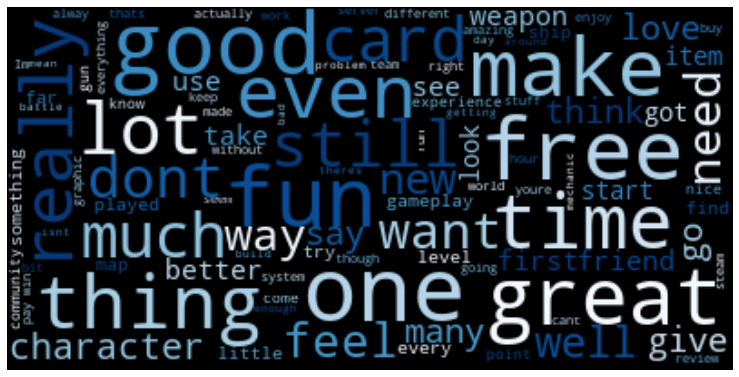

In [145]:
# WordCloud for positive review
positive_review = ' '.join(review[review['user_suggestion']==1]['user_review_clean'].values)
show_wordCloud(positive_review)

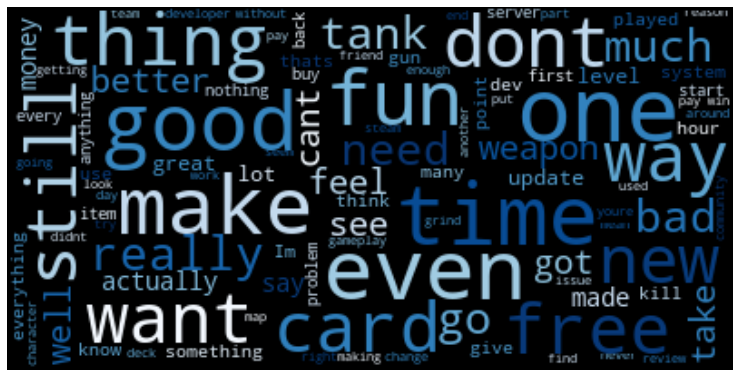

In [146]:
# WordCloud for negative review
negative_review = ' '.join(review[review['user_suggestion']==0]['user_review_clean'].values)
show_wordCloud(negative_review)

# IV. Modeling

## IV. A Vectorization
Sebelum modeling dilakukan akkan dilakukan 2 type vectorization, yaitu menggunakan :
- CountVectorizer
- TFIDFVectorizer

### CountVectorizer

In [147]:
from sklearn.feature_extraction.text import CountVectorizer

# Contoh Penggunaan
sample = ['Nama saya Budi Budi anduk', 'Budi tinggal di Bandung']
vect = CountVectorizer()
vect.fit(sample)

vect.vocabulary_

{'nama': 4,
 'saya': 5,
 'budi': 2,
 'anduk': 0,
 'tinggal': 6,
 'di': 3,
 'bandung': 1}

In [148]:
# Analogi
X = pd.DataFrame(sample, columns=['text'])
enc_texts = vect.transform(X['text'].values)
enc_texts = pd.DataFrame(enc_texts.toarray(), columns=vect.get_feature_names())

X = pd.concat([X, enc_texts], axis=1)
X.head(2)

,text,anduk,bandung,budi,di,nama,saya,tinggal
0,Nama saya Budi Budi anduk,1,0,2,0,1,1,0
1,Budi tinggal di Bandung,0,1,1,1,0,0,1


<b> Penerapan </b> <br>
Karena mungkin ada kata-kata unique yang berbeda didalam test dan train set, maka perlu disatukan terlebih dahulu

In [149]:
total_reviews = pd.concat([review['user_review_clean'], review_test['user_review_clean']], axis=0)
total_reviews.reset_index(drop=True, inplace=True)

vect = CountVectorizer()
vect.fit(total_reviews.values)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=1,
                ngram_range=(1, 1), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [150]:
# Mentranfromasi train dan test data kedalam vecotirizing
train_count_vect = vect.transform(review['user_review_clean'].values)
test_count_vect = vect.transform(review_test['user_review_clean'].values)

In [151]:
print("Banyaknya kata unique : {}".format(len(vect.get_feature_names())))

Banyaknya kata unique : 99167


### TFIDF-Vectorizer

In [152]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Contoh Penggunaan
sample = ['Nama saya Budi Budi anduk', 'Budi tinggal di Bandung']
vect = TfidfVectorizer()
vect.fit(sample)

vect.vocabulary_

{'nama': 4,
 'saya': 5,
 'budi': 2,
 'anduk': 0,
 'tinggal': 6,
 'di': 3,
 'bandung': 1}

In [153]:
# Analogi
X = pd.DataFrame(sample, columns=['text'])
enc_texts = vect.transform(X['text'].values)
enc_texts = pd.DataFrame(enc_texts.toarray(), columns=vect.get_feature_names())

X = pd.concat([X, enc_texts], axis=1)
X.head(2)

,text,anduk,bandung,budi,di,nama,saya,tinggal
0,Nama saya Budi Budi anduk,0.446101,0.000000,0.634809,0.000000,0.446101,0.446101,0.000000
1,Budi tinggal di Bandung,0.000000,0.534046,0.379978,0.534046,0.000000,0.000000,0.534046


### Penerapan

In [154]:
vect = TfidfVectorizer()
vect.fit(total_reviews.values)

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=1, ngram_range=(1, 1), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [155]:
# Mentranfromasi train dan test data kedalam TFIDF vecotirizing
train_tfidf_vect = vect.transform(review['user_review_clean'].values)
test_tfidf_vect = vect.transform(review_test['user_review_clean'].values)

In [156]:
print("Banyaknya kata unique : {}".format(len(vect.get_feature_names())))

Banyaknya kata unique : 99167


## IV. B Modeling dengan Logistic Regression

In [157]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score

In [158]:
X_train, X_valid, y_train, y_valid = train_test_split(train_count_vect, review['user_suggestion'], test_size=0.2, random_state=101)

model = LogisticRegression()
model.fit(X_train, y_train)

train_score = accuracy_score(y_train, model.predict(X_train))
valid_score = accuracy_score(y_valid, model.predict(X_valid))

print("Train Score : {}\nValid Score : {}".format(train_score, valid_score))

Train Score : 0.9905974251410387
Valid Score : 0.8495805611802141


In [159]:
# Cross validation score
results = cross_val_score(model, train_count_vect, review['user_suggestion'].values, cv=5, scoring='accuracy')

print("Accuracy Mean : \t{}\n3-Fold Scores : \t{}".format(results.mean(), results))

Accuracy Mean : 	0.7673434168729042
3-Fold Scores : 	[0.78420596 0.77263523 0.74891524 0.74334491 0.78761574]


<b>MODEL MENGGUNAKAN TFIDF </b>

In [160]:
X_train, X_valid, y_train, y_valid = train_test_split(train_tfidf_vect, review['user_suggestion'], test_size=0.2, random_state=101)
model = LogisticRegression()

model.fit(X_train, y_train)

train_score = accuracy_score(y_train, model.predict(X_train))
valid_score = accuracy_score(y_valid, model.predict(X_valid))

print("Train Score : {}\nValid Score : {}".format(train_score, valid_score))

Train Score : 0.916534066251989
Valid Score : 0.8594156783338155


In [161]:
results = cross_val_score(model, train_tfidf_vect, review['user_suggestion'].values, cv=5, scoring='accuracy')

print("Accuracy Mean : \t{}\n3-Fold Scores : \t{}".format(results.mean(), results))

Accuracy Mean : 	0.7900244003042673
3-Fold Scores : 	[0.80156205 0.80214058 0.77466011 0.76244213 0.80931713]


## IV. C Mencari Model Terbaik Dari Berbagai Algoritm

### Menggunakan CountVecotrizer

In [162]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, log_loss

def classification_model(n_cv):
    score = []
    model_name = ['LogisticRegression', 'MultinomialNB', 'DecisionTreeClassifier', 'RandomForestClassifier', 'KNeighborsClassifier']
    models = [LogisticRegression, MultinomialNB, DecisionTreeClassifier, RandomForestClassifier, KNeighborsClassifier]
    
    vect = CountVectorizer()
    vect.fit(total_reviews.values)
    train_count_vect = vect.transform(review['user_review_clean'].values)
    
    for item in models:
        X_train, X_valid, y_train, y_valid = train_test_split(train_count_vect, review['user_suggestion'], test_size=0.2, random_state=101)

        model = item()
        model.fit(X_train, y_train)

        train_score = (accuracy_score(y_train, model.predict(X_train)))
        test_score = (accuracy_score(y_valid, model.predict(X_valid)))
        crossval_score = (cross_val_score(model, train_count_vect, review['user_suggestion'].values, cv=n_cv, scoring='accuracy').mean())
        
        score.append([crossval_score,train_score, test_score])
        
    return pd.DataFrame(score,columns=['crossval_score','train_score','test_score'],index=model_name)

In [163]:
classification_model(5)

,crossval_score,train_score,test_score
LogisticRegression,0.767343,0.990597,0.849581
MultinomialNB,0.736735,0.924924,0.835117
DecisionTreeClassifier,0.661864,0.999928,0.685276
RandomForestClassifier,0.765145,0.999928,0.829043
KNeighborsClassifier,0.592662,0.704253,0.634365


### Menggunakan TFIDF 

In [164]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, log_loss, roc_curve, roc_auc_score

def classification_model_tfidf(n_cv):
    score = []
    model_name = ['LogisticRegression', 'MultinomialNB', 'DecisionTreeClassifier', 'RandomForestClassifier', 'KNeighborsClassifier']
    models = [LogisticRegression, MultinomialNB, DecisionTreeClassifier, RandomForestClassifier, KNeighborsClassifier]
    
    vect = TfidfVectorizer()
    vect.fit(total_reviews.values)
    train_count_vect = vect.transform(review['user_review_clean'].values)
    
    for item in models:
        X_train, X_valid, y_train, y_valid = train_test_split(train_count_vect, review['user_suggestion'], test_size=0.2, random_state=101)

        model = item()
        model.fit(X_train, y_train)

        train_score = (accuracy_score(y_train, model.predict(X_train)))
        test_score = (accuracy_score(y_valid, model.predict(X_valid)))
        crossval_score = (cross_val_score(model, train_count_vect, review['user_suggestion'].values, cv=n_cv, scoring='accuracy').mean())
        
        score.append([crossval_score,train_score, test_score])
        
    return pd.DataFrame(score,columns=['crossval_score','train_score','test_score'],index=model_name)

In [165]:
classification_model_tfidf(5)

,crossval_score,train_score,test_score
LogisticRegression,0.790024,0.916534,0.859416
MultinomialNB,0.698147,0.841964,0.770321
DecisionTreeClassifier,0.651970,0.999928,0.685855
RandomForestClassifier,0.768212,0.999928,0.829043
KNeighborsClassifier,0.620900,0.838276,0.769453


> Dari 10 model diatas terlihat bahwa model Logistic Regression dengan tfidf menghasilkan nilai corssval_score dan test_score yang paling baik, meskipun nilai train_scorenya masih dibawah model yang lain. Namun menurut model ini adalah model yang terbaik. Selanjutnya akan dicari hyperparameter untuk 3 model terbaik yaitu :
- Logistic Regression with tfidf
- MultinomialNB with countvectorizer
- RandomForest with tfidf

### Precison, recall, accuracy, log loss, roc-auc dari model terbaik

-----------------Report for Logistic ----------------------
[[1194  278]
 [ 208 1777]]
              precision    recall  f1-score   support

           0       0.85      0.81      0.83      1472
           1       0.86      0.90      0.88      1985

    accuracy                           0.86      3457
   macro avg       0.86      0.85      0.86      3457
weighted avg       0.86      0.86      0.86      3457

logloss : 0.36578341807461984


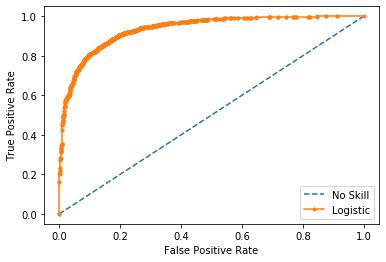

RocAuc Socre : 0.9348199129339612


-----------------Report for Multinomial ----------------------
[[1188  284]
 [ 286 1699]]
              precision    recall  f1-score   support

           0       0.81      0.81      0.81      1472
           1       0.86      0.86      0.86      1985

    accuracy                           0.84      3457
   macro avg       0.83      0.83      0.83      3457
weighted avg       0.84      0.84      0.84      3457

logloss : 0.811688591932026


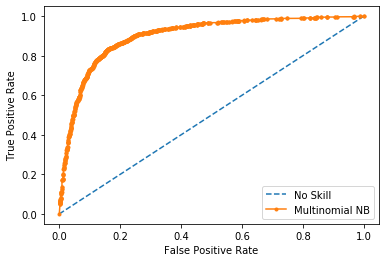

RocAuc Socre : 0.9005491252327236


-----------------Report for Random Forest ----------------------
[[1056  416]
 [ 176 1809]]
              precision    recall  f1-score   support

           0       0.86      0.72      0.78      1472
           1       0.81      0.91      0.86      1985

    accuracy                           0.83      3457
   macro avg       0.84      0.81      0.82      3457
weighted avg       0.83      0.83      0.83      3457

logloss : 0.48027427662011885


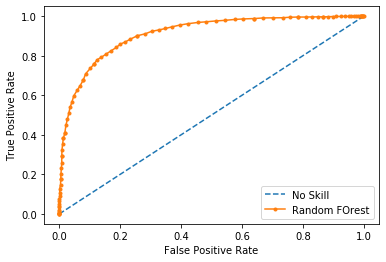

RocAuc Socre : 0.9112499657759283




In [166]:
vect_tf = TfidfVectorizer()
vect_tf.fit(total_reviews.values)

vect_count = CountVectorizer()
vect_count.fit(total_reviews.values)

# Mentranfromasi train dan test data kedalam TFIDF vecotirizing
train_tfidf_vect = vect_tf.transform(review['user_review_clean'].values)
test_tfidf_vect = vect_tf.transform(review_test['user_review_clean'].values)

# Mentranfromasi train dan test data kedalam vecotirizing
train_count_vect = vect_count.transform(review['user_review_clean'].values)
test_count_vect = vect_count.transform(review_test['user_review_clean'].values)

# Modeling
X_trainTF, X_validTF, y_trainTF, y_validTF = train_test_split(train_tfidf_vect, review['user_suggestion'], test_size=0.2, random_state=101)
X_trainCN, X_validCN, y_trainCN, y_validCN = train_test_split(train_count_vect, review['user_suggestion'], test_size=0.2, random_state=101)

model_log = LogisticRegression()
model_log.fit(X_trainTF, y_trainTF)
model_mult = MultinomialNB()
model_mult.fit(X_trainCN, y_trainCN)
model_rand = RandomForestClassifier()
model_rand.fit(X_trainTF, y_trainTF)

# Precision Recall
from sklearn.metrics import confusion_matrix, classification_report

prediction_log = model_log.predict(X_validTF)
proba_log = model_log.predict_proba(X_validTF)

prediction_mult = model_mult.predict(X_validCN)
proba_mult = model_mult.predict_proba(X_validCN)

prediction_rand = model_rand.predict(X_validTF)
proba_rand = model_rand.predict_proba(X_validTF)

print('-----------------Report for Logistic ----------------------')
print(confusion_matrix(y_validTF, prediction_log))
print(classification_report(y_validTF, prediction_log))
print('logloss : {}'.format(log_loss(y_validTF, proba_log[:,1])))
# plot the roc curve for the model
fpr, tpr, thresholds = roc_curve(y_validTF,proba_log[:,1])
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='Logistic')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.show()
print('RocAuc Socre : {}'.format(roc_auc_score(y_validTF,proba_log[:,1])))
print('\n')

print('-----------------Report for Multinomial ----------------------')
print(confusion_matrix(y_validCN, prediction_mult))
print(classification_report(y_validCN, prediction_mult))
print('logloss : {}'.format(log_loss(y_validCN, proba_mult[:,1])))
# plot the roc curve for the model
fpr, tpr, thresholds = roc_curve(y_validCN,proba_mult[:,1])
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='Multinomial NB')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.show()
print('RocAuc Socre : {}'.format(roc_auc_score(y_validCN,proba_mult[:,1])))
print('\n')

print('-----------------Report for Random Forest ----------------------')
print(confusion_matrix(y_validTF, prediction_rand))
print(classification_report(y_validTF, prediction_rand))
print('logloss : {}'.format(log_loss(y_validTF, proba_rand[:,1])))
# plot the roc curve for the model
fpr, tpr, thresholds = roc_curve(y_validTF,proba_rand[:,1])
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='Random FOrest')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.show()
print('RocAuc Socre : {}'.format(roc_auc_score(y_validTF,proba_rand[:,1])))
print('\n')


> Model yang didapatkan sudah cukup baik

## IV. D Mencari HyperParameter untuk model Logistic Regression

In [167]:
from sklearn.model_selection import GridSearchCV
# List parameter yang akan diuji
penalty = ['l1', 'l2']
C = np.logspace(-4,4,20) 
hyperparameters = dict(penalty=penalty, C=C)

# Grid search cv
model = LogisticRegression()
clf = GridSearchCV(model, hyperparameters, cv=5,  n_jobs=-1)
best_model_log = clf.fit(X_trainTF, y_trainTF)

In [168]:
best_model_log.best_estimator_.get_params()

{'C': 4.281332398719396,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [169]:
prediction = best_model_log.predict(X_validTF)
proba_log = best_model_log.predict_proba(X_validTF)

In [170]:
print('-------------- Report for Logistic Regression with Hyperparameter -----------------')
print(classification_report(y_validTF, prediction))
print('logloss : {}'.format(log_loss(y_validTF, proba_log[:,1])))
print('RocAuc Socre : {}'.format(roc_auc_score(y_validTF,proba_log[:,1])))

-------------- Report for Logistic Regression with Hyperparameter -----------------
              precision    recall  f1-score   support

           0       0.85      0.82      0.83      1472
           1       0.87      0.89      0.88      1985

    accuracy                           0.86      3457
   macro avg       0.86      0.86      0.86      3457
weighted avg       0.86      0.86      0.86      3457

logloss : 0.3243300020517522
RocAuc Socre : 0.9366854670901326


> Dengan Hyperparameter terdapat sedikit peningkatan pada precision dari model Logistik parameter dan penurun nilai logloss yang cukup besar

## IV. D Mencari HyperParameter untuk model Mutinomial NB

In [171]:
from sklearn.model_selection import GridSearchCV
# List parameter yang akan diuji
alpha = np.linspace(0.5, 1.5, 6)
fit_prior = [True, False]

hyperparameters = dict(alpha=alpha, fit_prior=fit_prior)

# Grid search cv
model = MultinomialNB()
clf = GridSearchCV(model, hyperparameters, cv=5, n_jobs=-1)
best_model_mult = clf.fit(X_trainCN, y_trainCN)

In [172]:
best_model_mult.best_estimator_.get_params()

{'alpha': 1.5, 'class_prior': None, 'fit_prior': False}

In [173]:
prediction = best_model_mult.predict(X_validCN)
proba_mult = best_model_mult.predict_proba(X_validCN)

In [174]:
print('-------------- Report for Multinomial NB with Hyperparameter -----------------')
print(classification_report(y_validCN, prediction))
print('logloss : {}'.format(log_loss(y_validCN, proba_mult[:,1])))
print('RocAuc Socre : {}'.format(roc_auc_score(y_validCN,proba_mult[:,1])))

-------------- Report for Multinomial NB with Hyperparameter -----------------
              precision    recall  f1-score   support

           0       0.81      0.81      0.81      1472
           1       0.86      0.86      0.86      1985

    accuracy                           0.84      3457
   macro avg       0.83      0.83      0.83      3457
weighted avg       0.84      0.84      0.84      3457

logloss : 0.8009451346245386
RocAuc Socre : 0.8997499931551856


> Model hyperparameter untuk multinomial NB justru memberikan model yang kurang baik dari model sebelumnya

## IV. D Mencari HyperParameter untuk model Random Forest

In [175]:
# List Parameter yang akan diuji
n_estimators = [100,200,300]
min_samples_split = [8,10,12]
min_samples_leaf = [3, 4, 5]

hyperparameters = {'n_estimators': n_estimators,
                   'min_samples_split': min_samples_split,
                   'min_samples_leaf': min_samples_leaf}

# Grid search cv
model = RandomForestClassifier()
clf = GridSearchCV(model, hyperparameters, cv=5, n_jobs=-1)
best_model_rand = clf.fit(X_trainTF, y_trainTF)

In [176]:
best_model_rand.best_estimator_.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 300,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [177]:
prediction = best_model_rand.predict(X_validTF)
proba_rand = best_model_rand.predict_proba(X_validTF)

In [178]:
print('-------------- Report for Multinomial NB with Hyperparameter -----------------')
print(classification_report(y_validTF, prediction))
print('logloss : {}'.format(log_loss(y_validTF, proba_rand[:,1])))
print('RocAuc Socre : {}'.format(roc_auc_score(y_validTF,proba_rand[:,1])))

-------------- Report for Multinomial NB with Hyperparameter -----------------
              precision    recall  f1-score   support

           0       0.88      0.68      0.77      1472
           1       0.80      0.93      0.86      1985

    accuracy                           0.83      3457
   macro avg       0.84      0.81      0.82      3457
weighted avg       0.84      0.83      0.82      3457

logloss : 0.5223724895994414
RocAuc Socre : 0.9208688122878108


Kesimpulan : Model Logistic Regression dengan menggunakan TFID dan hyperparameter 'C': 4.281332398719396 merupakan model terbaik.

## IV. E Uji coba model untuk data Test

In [179]:
review_test

,review_id,title,year,user_review,user_review_clean
0,1603,Counter-Strike: Global Offensive,2015.0,"Nice graphics, new maps, weapons and models. B...",Nice graphics new maps weapons models develope...
1,1604,Counter-Strike: Global Offensive,2018.0,I would not recommend getting into this at its...,would recommend getting current state CSGO hit...
2,1605,Counter-Strike: Global Offensive,2018.0,Edit 11/12/18I have tried playing CS:GO recent...,Edit 11 12 18 tried CSGO recently dramatically...
3,1606,Counter-Strike: Global Offensive,2015.0,The game is great. But the community is the wo...,great community worstIf youre match russian ma...
4,1607,Counter-Strike: Global Offensive,2015.0,I thank TrulyRazor for buying this for me a lo...,thank Truly Razor buying long time ago insiste...
...,...,...,...,...,...
8040,25198,GUNS UP!,2017.0,Early Access ReviewGuns UP!Positive: Good Idea...,Guns UPPositive Good Idea addicting lots fun W...
8041,25199,GUNS UP!,2018.0,"After 170 hrs, my review. DO NOT SPEND ANY MON...",1 0 hrs review SPEND MONEY would seam better c...
8042,25200,GUNS UP!,2018.0,Pros:-Fun GameplayCons: -Micro %$#*ing transac...,ProsFun Gameplay Cons Micro ing transactionsDo...
8043,25201,GUNS UP!,2018.0,"Actualy saucy, I definetly suggest to players ...",Actualy saucy definetly suggest whod life new ...


In [180]:
test_tfidf_vect = vect_tf.transform(review_test['user_review_clean'].values)
prediction_test = best_model_log.predict(test_tfidf_vect)

In [181]:
check =pd.DataFrame({
    'review':review_test['user_review'].values,
    'prediction':prediction_test
})

check.prediction = check.prediction.map({
    0: 'negative review',
    1: 'positive review'
})

### Beberapa Sample

In [182]:
check.iloc[1]['review']

'I would not recommend getting into this at its current state. CSGO has hit rock bottom with Valve\'s missed promises of game changing updates and their lack of effort to combat the terrible cheating problem. Bugs have been in the game for years and still haven\'t been fixed. Cheating is out of control. Over the past few years of playing, cheating has gotten worse and worse to the point now where I end up playing against a cheater almost every game. Valve implemented the new "trust" matchmaking system to combat some of these issues but its lackluster algorithm still somehow thinks putting me, with years of gameplay and 3,000+ hours, against people playing on brand new accounts makes sense. I really don\'t know why I still put the effort to play this game anymore because it usually just ends up with me regretting it. I guess I just wish I could somehow have the fun I used to have playing this game but it seems those days are long gone.'

In [183]:
check.iloc[1]['prediction']

'negative review'

In [184]:
check.iloc[100]['review']

'Currently unplayable due to these reasons:1)Messed Up Hit Registry2)Vile Community3)Exccessive use of CheatsOnce they fix the game i will switch this review positively. Considering i stay alive till year 2070'

In [185]:
check.iloc[100]['prediction']

'negative review'

In [186]:
check.iloc[1000]['review']

"great to play and a lot of fun for every one.You dont have to be a Star trek fan to know the game.And its free to play or if you want you can be a gold member with extra'sBut in overal a fun and great game ^^"

In [187]:
check.iloc[1000]['prediction']

'positive review'

Model sudah cukup baik dalam melakukan prediksi dengan accuracy sekitar 80%